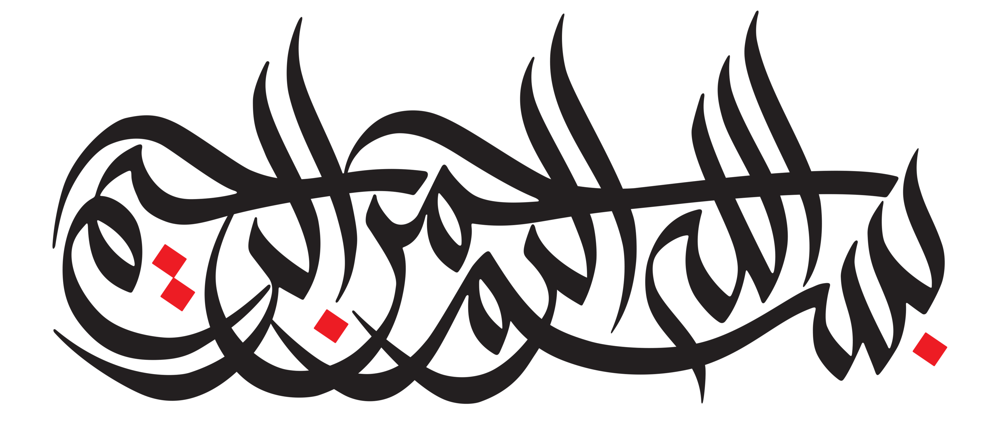

# Context

In this research, a dataset containing supply chain data of an online store is examined.First, data preprocessing and cleaning is done. Then, exploratory analysis is performed on the data. And finally, two types of predictions are made on the data using machine learning algorithms.First, predict the amount of order sales. Second, pre-risk delivery of the order on time.

**To what extent are machine learning algorithms effective in predicting sales and the risk of sending orders on time?**

**What factors affect the amount of order sales?**

**Is there a special relationship and correlation between the features in the dataset?**

The Features of this dataset are as follows:

**Features Description**

Type	:  Type of transaction made

Days for shipping (real)     	:  Actual shipping days of the purchased product

Days for shipment (scheduled)	:  Days of scheduled delivery of the purchased product

Benefit per order	:  Earnings per order placed

Sales per customer	:  Total sales per customer made per customer

Delivery Status	:  Delivery status of orders: Advance shipping , Late delivery , Shipping canceled , Shipping on time

Late_delivery_risk           	:  Categorical variable that indicates if sending is late (1), it is not late (0).

Category Id	:  Product category code

Category Name	:  Description of the product category

Customer City	:  City where the customer made the purchase

Customer Country	:  Country where the customer made the purchase

Customer Email	:  Customer's email

Customer Fname	:  Customer name

Customer Id	:  Customer ID

Customer Lname	:  Customer lastname

Customer Password	:  Masked customer key

Customer Segment	:  Types of Customers: Consumer , Corporate , Home Office

Customer State	:  State to which the store where the purchase is registered belongs

Customer Street	:  Street to which the store where the purchase is registered belongs

Customer Zipcode	:  Customer Zipcode

Department Id	:  Department code of store

Department Name	:  Department name of store

Latitude	:  Latitude corresponding to location of store

Longitude	:  Longitude corresponding to location of store

Market	:  Market to where the order is delivered : Africa , Europe , LATAM , Pacific Asia , USCA

Order City	:  Destination city of the order

Order Country	:  Destination country of the order

Order Customer Id	:  Customer order code

order date (DateOrders)	:  Date on which the order is made

Order Id	:  Order code

Order Item Cardprod Id	:  Product code generated through the RFID reader

Order Item Discount	:  Order item discount value

Order Item Discount Rate     	:  Order item discount percentage

Order Item Id	:  Order item code

Order Item Product Price     	:  Price of products without discount

Order Item Profit Ratio	:  Order Item Profit Ratio

Order Item Quantity	:  Number of products per order

Sales	:  Value in sales

Order Item Total  	:  Total amount per order

Order Profit Per Order	:  Order Profit Per Order

Order Region	:  Region of the world where the order is delivered :  Southeast Asia ,South Asia ,Oceania ,Eastern Asia, West Asia , West of USA , US Center , West Africa, Central Africa ,North Africa ,Western Europe ,Northern , Caribbean , South America ,East Africa ,Southern Europe , East of USA ,Canada ,Southern Africa , Central Asia ,  Europe , Central America, Eastern Europe , South of  USA

Order State	:  State of the region where the order is delivered

Order Status	:  Order Status : COMPLETE , PENDING , CLOSED , PENDING_PAYMENT ,CANCELED , PROCESSING ,SUSPECTED_FRAUD ,ON_HOLD ,PAYMENT_REVIEW

Product Card Id	:  Product code

Product Category Id	:  Product category code

Product Description	:  Product Description

Product Image	:  Link of visit and purchase of the product

Product Name	:  Product Name

Product Price	:  Product Price

Product Status	:  Status of the product stock :If it is 1 not available , 0 the product is available

Shipping date (DateOrders)   	:  Exact date and time of shipment

Shipping Mode	:  The following shipping modes are presented : Standard Class , First Class , Second Class , Same Day

## Import Libraries For Overview & EDA

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
from category_encoders.hashing import HashingEncoder

## Get The Dataset

In [2]:
data = pd.read_csv('E:/IUST/Areze/DataCoSupplyChainDataset.csv',encoding='ISO-8859-1')

## Overview Of The Dataset

In [3]:
data.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [4]:
data.tail()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
180514,CASH,4,4,40.000000,399.980011,Shipping on time,0,45,Fishing,Brooklyn,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 3:40,Standard Class
180515,DEBIT,3,2,-613.770019,395.980011,Late delivery,1,45,Fishing,Bakersfield,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/19/2016 1:34,Second Class
180516,TRANSFER,5,4,141.110001,391.980011,Late delivery,1,45,Fishing,Bristol,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 21:00,Standard Class
180517,PAYMENT,3,4,186.229996,387.980011,Advance shipping,0,45,Fishing,Caguas,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 20:18,Standard Class
180518,PAYMENT,4,4,168.949997,383.980011,Shipping on time,0,45,Fishing,Caguas,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/19/2016 18:54,Standard Class


In [5]:
data.sample(5)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
47045,PAYMENT,2,4,6.910000,115.180000,Advance shipping,0,17,Cleats,Waukegan,...,23434.0,365,17,NaN,http://images.acmesports.sports/Perfect+Fitnes...,Perfect Fitness Perfect Rip Deck,59.990002,0,7/25/2016 2:10,Standard Class
114147,CASH,5,4,36.950001,131.949997,Late delivery,1,46,Indoor/Outdoor Games,Westminster,...,NaN,1014,46,NaN,http://images.acmesports.sports/O%27Brien+Men%...,O'Brien Men's Neoprene Life Vest,49.980000,0,2/14/2015 17:59,Standard Class
128376,DEBIT,5,4,85.250000,293.970001,Late delivery,1,9,Cardio Equipment,Jacksonville,...,NaN,191,9,NaN,http://images.acmesports.sports/Nike+Men%27s+F...,Nike Men's Free 5.0+ Running Shoe,99.989998,0,10/8/2015 13:48,Standard Class
127830,DEBIT,5,4,45.000000,149.990005,Late delivery,1,9,Cardio Equipment,Hanford,...,NaN,191,9,NaN,http://images.acmesports.sports/Nike+Men%27s+F...,Nike Men's Free 5.0+ Running Shoe,99.989998,0,2/3/2017 20:29,Standard Class
40131,DEBIT,6,2,-325.940002,424.959992,Late delivery,1,9,Cardio Equipment,Caguas,...,NaN,191,9,NaN,http://images.acmesports.sports/Nike+Men%27s+F...,Nike Men's Free 5.0+ Running Shoe,99.989998,0,6/27/2017 2:56,Second Class


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

In [7]:
data.describe()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180516.000000,180519.000000,180519.000000,...,180519.000000,180519.000000,180519.000000,180519.000000,24840.000000,180519.000000,180519.000000,0.0,180519.000000,180519.0
mean,3.497654,2.931847,21.974989,183.107609,0.548291,31.851451,6691.379495,35921.126914,5.443460,29.719955,...,2.127638,203.772096,183.107609,21.974989,55426.132327,692.509764,31.851451,NaN,141.232550,0.0
std,1.623722,1.374449,104.433526,120.043670,0.497664,15.640064,4162.918106,37542.461122,1.629246,9.813646,...,1.453451,132.273077,120.043670,104.433526,31919.279101,336.446807,15.640064,NaN,139.732492,0.0
min,0.000000,0.000000,-4274.979980,7.490000,0.000000,2.000000,1.000000,603.000000,2.000000,-33.937553,...,1.000000,9.990000,7.490000,-4274.979980,1040.000000,19.000000,2.000000,NaN,9.990000,0.0
25%,2.000000,2.000000,7.000000,104.379997,0.000000,18.000000,3258.500000,725.000000,4.000000,18.265432,...,1.000000,119.980003,104.379997,7.000000,23464.000000,403.000000,18.000000,NaN,50.000000,0.0
50%,3.000000,4.000000,31.520000,163.990005,1.000000,29.000000,6457.000000,19380.000000,5.000000,33.144863,...,1.000000,199.919998,163.990005,31.520000,59405.000000,627.000000,29.000000,NaN,59.990002,0.0
75%,5.000000,4.000000,64.800003,247.399994,1.000000,45.000000,9779.000000,78207.000000,7.000000,39.279617,...,3.000000,299.950012,247.399994,64.800003,90008.000000,1004.000000,45.000000,NaN,199.990005,0.0
max,6.000000,4.000000,911.799988,1939.989990,1.000000,76.000000,20757.000000,99205.000000,12.000000,48.781933,...,5.000000,1999.989990,1939.989990,911.799988,99301.000000,1363.000000,76.000000,NaN,1999.989990,0.0


# Data Cleaning

## Columns

In [8]:
data.columns

Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Category Id', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Email', 'Customer Fname', 'Customer Id',
       'Customer Lname', 'Customer Password', 'Customer Segment',
       'Customer State', 'Customer Street', 'Customer Zipcode',
       'Department Id', 'Department Name', 'Latitude', 'Longitude', 'Market',
       'Order City', 'Order Country', 'Order Customer Id',
       'order date (DateOrders)', 'Order Id', 'Order Item Cardprod Id',
       'Order Item Discount', 'Order Item Discount Rate', 'Order Item Id',
       'Order Item Product Price', 'Order Item Profit Ratio',
       'Order Item Quantity', 'Sales', 'Order Item Total',
       'Order Profit Per Order', 'Order Region', 'Order State', 'Order Status',
       'Order Zipcode', 'Product Card Id', 'Product Category Id',
       'Product De

### Type

In [9]:
data['Type'].value_counts()

DEBIT       69295
TRANSFER    49883
PAYMENT     41725
CASH        19616
Name: Type, dtype: int64

### Days for shipping (real)

In [10]:
data['Days for shipping (real)'].value_counts()

2    56618
3    28765
6    28723
4    28513
5    28163
0     5080
1     4657
Name: Days for shipping (real), dtype: int64

### Days for shipment (scheduled)

In [11]:
data['Days for shipment (scheduled)'].value_counts()

4    107752
2     35216
1     27814
0      9737
Name: Days for shipment (scheduled), dtype: int64

### Benefit per order

In [12]:
data['Benefit per order'].value_counts()

 0.000000      1177
 143.990005     199
 72.000000      194
 46.799999      188
 24.000000      181
               ... 
-48.830002        1
 48.220001        1
-145.729996       1
-330.109985       1
-337.100006       1
Name: Benefit per order, Length: 21998, dtype: int64

### Sales per customer

In [13]:
data['Sales per customer'].value_counts()

122.839996    1264
109.190002    1247
124.790001    1243
129.990005    1243
116.989998    1243
              ... 
455.950012       1
470.250000       1
424.790008       1
98.010002        1
474.760010       1
Name: Sales per customer, Length: 2927, dtype: int64

### Delivery Status

In [14]:
data['Delivery Status'].value_counts()

Late delivery        98977
Advance shipping     41592
Shipping on time     32196
Shipping canceled     7754
Name: Delivery Status, dtype: int64

### Late_delivery_risk

In [15]:
data['Late_delivery_risk'].value_counts()

1    98977
0    81542
Name: Late_delivery_risk, dtype: int64

### Category Id

In [16]:
data['Category Id'].value_counts()

17    24551
18    22246
24    21035
46    19298
45    17325
48    15540
43    13729
9     12487
29    10984
37     2029
40     1780
36     1475
26     1201
13     1127
35     1070
41      974
75      838
63      652
76      650
3       632
7       614
62      592
74      529
33      524
72      492
66      484
68      484
67      483
64      442
32      441
44      440
71      434
65      431
12      423
59      405
38      384
69      362
73      357
5       343
6       328
11      309
30      283
61      271
70      208
60      207
31      181
2       138
10      111
16       68
4        67
34       61
Name: Category Id, dtype: int64

### Category Name

In [17]:
data['Category Name'].value_counts()

Cleats                  24551
Men's Footwear          22246
Women's Apparel         21035
Indoor/Outdoor Games    19298
Fishing                 17325
Water Sports            15540
Camping & Hiking        13729
Cardio Equipment        12487
Shop By Sport           10984
Electronics              3156
Accessories              1780
Golf Balls               1475
Girls' Apparel           1201
Golf Gloves              1070
Trade-In                  974
Video Games               838
Children's Clothing       652
Women's Clothing          650
Baseball & Softball       632
Hockey                    614
Cameras                   592
Toys                      529
Golf Shoes                524
Pet Supplies              492
Garden                    484
Crafts                    484
DVDs                      483
Computers                 442
Golf Apparel              441
Hunting & Shooting        440
Music                     434
Consumer Electronics      431
Boxing & MMA              423
Books     

### Customer City

In [18]:
data['Customer City'].value_counts()

Caguas         66770
Chicago         3885
Los Angeles     3417
Brooklyn        3412
New York        1816
               ...  
Bartlett          25
Malden            22
Ponce             22
Freehold          13
CA                 3
Name: Customer City, Length: 563, dtype: int64

### Customer Country

In [19]:
data['Customer Country'].value_counts()

EE. UU.        111146
Puerto Rico     69373
Name: Customer Country, dtype: int64

In [20]:
CustomerCountry_map = {'EE. UU.':'USA','Puerto Rico':'Puerto Rico'}
data['Customer Country'] = data['Customer Country'].map(CustomerCountry_map)

In [21]:
data['Customer Country'].value_counts()

USA            111146
Puerto Rico     69373
Name: Customer Country, dtype: int64

### Customer Email

In [22]:
data['Customer Email'].value_counts()

XXXXXXXXX    180519
Name: Customer Email, dtype: int64

### Customer Fname

In [23]:
data['Customer Fname'].value_counts()

Mary       65150
James       1835
Robert      1759
Michael     1680
David       1625
           ...  
Lina           1
Cami           1
Ana            1
Nadin          1
Brees          1
Name: Customer Fname, Length: 782, dtype: int64

### Customer Id

In [24]:
data['Customer Id'].value_counts()

5654     47
10591    45
5004     45
5715     44
3708     44
         ..
18698     1
15537     1
15484     1
20681     1
2677      1
Name: Customer Id, Length: 20652, dtype: int64

In [25]:
data[data['Customer Id']==5654]

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
6224,PAYMENT,6,4,0.460000,41.500000,Late delivery,1,24,Women's Apparel,Caguas,...,NaN,502,24,NaN,http://images.acmesports.sports/Nike+Men%27s+D...,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,1/19/2017 3:41,Standard Class
6754,PAYMENT,5,4,12.600000,200.000000,Late delivery,1,24,Women's Apparel,Caguas,...,NaN,502,24,NaN,http://images.acmesports.sports/Nike+Men%27s+D...,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,8/19/2017 18:37,Standard Class
6912,PAYMENT,5,4,100.089996,454.950012,Late delivery,1,9,Cardio Equipment,Caguas,...,NaN,191,9,NaN,http://images.acmesports.sports/Nike+Men%27s+F...,Nike Men's Free 5.0+ Running Shoe,99.989998,0,8/19/2017 18:37,Standard Class
10652,PAYMENT,6,4,90.660004,278.950012,Late delivery,1,17,Cleats,Caguas,...,NaN,365,17,NaN,http://images.acmesports.sports/Perfect+Fitnes...,Perfect Fitness Perfect Rip Deck,59.990002,0,1/19/2017 3:41,Standard Class
10667,PAYMENT,6,4,-37.750000,173.960007,Late delivery,1,29,Shop By Sport,Caguas,...,NaN,627,29,NaN,http://images.acmesports.sports/Under+Armour+G...,Under Armour Girls' Toddler Spine Surge Runni,39.990002,0,1/19/2017 3:41,Standard Class
10795,TRANSFER,2,1,37.750000,114.389999,Late delivery,1,18,Men's Footwear,Caguas,...,NaN,403,18,NaN,http://images.acmesports.sports/Nike+Men%27s+C...,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,0,3/24/2017 22:51,First Class
11075,TRANSFER,2,1,52.840000,145.559998,Late delivery,1,29,Shop By Sport,Caguas,...,NaN,627,29,NaN,http://images.acmesports.sports/Under+Armour+G...,Under Armour Girls' Toddler Spine Surge Runni,39.990002,0,3/24/2017 22:51,First Class
11497,TRANSFER,5,2,24.090000,113.089996,Late delivery,1,18,Men's Footwear,Caguas,...,88220.0,403,18,NaN,http://images.acmesports.sports/Nike+Men%27s+C...,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,0,5/16/2016 8:45,Second Class
11624,TRANSFER,5,2,40.570000,88.199997,Late delivery,1,9,Cardio Equipment,Caguas,...,88220.0,172,9,NaN,http://images.acmesports.sports/Nike+Women%27s...,Nike Women's Tempo Shorts,30.000000,0,5/16/2016 8:45,Second Class
11736,TRANSFER,5,2,-11.280000,296.950012,Late delivery,1,17,Cleats,Caguas,...,88220.0,365,17,NaN,http://images.acmesports.sports/Perfect+Fitnes...,Perfect Fitness Perfect Rip Deck,59.990002,0,5/16/2016 8:45,Second Class


### Customer Lname

In [26]:
data['Customer Lname'].value_counts()

Smith       64104
Johnson       989
Brown         909
Williams      869
Jones         859
            ...  
Dias            1
Will            1
Godinho         1
Mcke            1
Harri           1
Name: Customer Lname, Length: 1109, dtype: int64

### Customer Password

In [27]:
data['Customer Password'].value_counts()

XXXXXXXXX    180519
Name: Customer Password, dtype: int64

### Customer Segment

In [28]:
data['Customer Segment'].value_counts()

Consumer       93504
Corporate      54789
Home Office    32226
Name: Customer Segment, dtype: int64

### Customer State

In [29]:
data['Customer State'].value_counts()

PR       69373
CA       29223
NY       11327
TX        9103
IL        7631
FL        5456
OH        4095
PA        3824
MI        3804
NJ        3191
AZ        3026
GA        2503
MD        2415
NC        1992
CO        1914
VA        1849
OR        1668
MA        1607
TN        1582
NV        1440
MO        1354
HI        1248
CT        1094
UT         968
NM         949
LA         948
WA         920
WI         850
MN         672
SC         665
IN         581
DC         579
KY         487
KS         458
DE         269
RI         243
WV         241
OK         232
ND         215
ID         167
AR         164
MT          87
IA          67
AL          35
95758        2
91732        1
Name: Customer State, dtype: int64

In [30]:
data[data['Customer State']=='95758']

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
35704,DEBIT,2,1,66.379997,189.660004,Late delivery,1,65,Consumer Electronics,CA,...,NaN,1352,65,NaN,http://images.acmesports.sports/Industrial+con...,Industrial consumer electronics,252.880005,0,11/4/2017 18:31,First Class
46440,PAYMENT,4,4,10.910000,38.959999,Shipping on time,0,75,Video Games,CA,...,NaN,1362,75,NaN,http://images.acmesports.sports/Fighting+video...,Fighting video games,39.750000,0,12/14/2017 15:18,Standard Class


In [31]:
data.drop([35704,46440],inplace=True)

In [32]:
data[data['Customer State']=='95758']

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode


In [33]:
data[data['Customer State']=='91732']

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
82511,DEBIT,4,4,59.990002,299.959992,Shipping on time,0,63,Children's Clothing,CA,...,NaN,1350,63,NaN,http://images.acmesports.sports/Children+heaters,Children's heaters,357.100006,0,10/30/2017 0:29,Standard Class


In [34]:
data.drop([82511],inplace=True)

In [35]:
data[data['Customer State']=='91732']

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode


### Customer Street

In [36]:
data['Customer Street'].value_counts()

9126 Wishing Expressway     122
4388 Burning Goose Ridge    117
4720 Noble Hills Wynd       116
2878 Hazy Wagon  Thicket    113
398 Emerald Grove           109
                           ... 
9468 Red Corner               1
7676 Colonial Towers          1
3440 Emerald Knoll            1
6425 Thunder Impasse          1
8621 Broad Forest             1
Name: Customer Street, Length: 7456, dtype: int64

### Customer Zipcode

In [37]:
data['Customer Zipcode'].value_counts()

725.0      66770
921.0        337
23455.0      334
957.0        297
79109.0      292
           ...  
60636.0       18
89015.0       16
32210.0       15
7728.0        13
11225.0        9
Name: Customer Zipcode, Length: 995, dtype: int64

### Department Id

In [38]:
data['Department Id'].value_counts()

7     66861
4     48997
5     33220
3     14525
6      9686
2      2479
9      2025
10     1464
11      492
8       405
12      362
Name: Department Id, dtype: int64

### Department Name

In [39]:
data['Department Name'].value_counts()

Fan Shop              66861
Apparel               48997
Golf                  33220
Footwear              14525
Outdoors               9686
Fitness                2479
Discs Shop             2025
Technology             1464
Pet Shop                492
Book Shop               405
Health and Beauty       362
Name: Department Name, dtype: int64

### Latitude

In [40]:
data['Latitude'].value_counts()

18.227573    417
39.495914    370
18.227577    300
36.910831    280
26.098499    270
            ... 
18.246769      1
18.214268      1
18.253412      1
18.287685      1
18.242485      1
Name: Latitude, Length: 11248, dtype: int64

### Longitude

In [41]:
data['Longitude'].value_counts()

-66.370613     3821
-66.370575     3523
-66.370590     3522
-66.370506     3465
-66.370552     3417
               ... 
-77.381859        1
-118.428261       1
-119.781486       1
-88.943802        1
-112.236633       1
Name: Longitude, Length: 4485, dtype: int64

### Market

In [42]:
data['Market'].value_counts()

LATAM           51594
Europe          50250
Pacific Asia    41259
USCA            25799
Africa          11614
Name: Market, dtype: int64

### Order City

In [43]:
data['Order City'].value_counts()

Santo Domingo    2211
New York City    2202
Los Angeles      1845
Tegucigalpa      1783
Managua          1682
                 ... 
Libourne            1
Bergerac            1
Juliaca             1
Takasaki            1
Pernik              1
Name: Order City, Length: 3597, dtype: int64

### Order Country

In [44]:
data['Order Country'].value_counts()

Estados Unidos       24840
Francia              13221
México               13172
Alemania              9564
Australia             8497
                     ...  
Guinea Ecuatorial        2
Kuwait                   2
Sáhara Occidental        2
Burundi                  1
Serbia                   1
Name: Order Country, Length: 164, dtype: int64

### Order Customer Id

In [45]:
data['Order Customer Id'].value_counts()

5654     47
10591    45
5004     45
3708     44
5715     44
         ..
15620     1
18698     1
15537     1
15484     1
2677      1
Name: Order Customer Id, Length: 20649, dtype: int64

### Order date (DateOrders)

In [46]:
data['order date (DateOrders)'].value_counts()

12/14/2016 12:29    5
9/22/2015 3:50      5
12/31/2016 9:50     5
9/23/2015 18:22     5
2/11/2016 16:35     5
                   ..
9/5/2016 5:58       1
9/6/2016 1:56       1
9/6/2016 3:20       1
9/6/2016 19:27      1
1/17/2016 5:56      1
Name: order date (DateOrders), Length: 65749, dtype: int64

In [47]:
data['order date (DateOrders)'] = data['order date (DateOrders)'].apply(lambda x:pd.to_datetime(x))

In [48]:
data['DateOrders'] = data['order date (DateOrders)'].apply(lambda x:x.date())

In [49]:
data['TimeOrders'] = data['order date (DateOrders)'].apply(lambda x:x.time())

In [50]:
data['DayOrders'] = data['order date (DateOrders)'].apply(lambda x:x.day)

In [51]:
data['MonthOrders'] = data['order date (DateOrders)'].apply(lambda x:x.month)

In [52]:
data['YearOrders'] = data['order date (DateOrders)'].apply(lambda x:x.year)

In [53]:
data['DayOfWeekOrders'] = data['order date (DateOrders)'].apply(lambda x:x.dayofweek)

In [54]:
dayofweek_map = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
data['DayOfWeekOrders'] = data['DayOfWeekOrders'].map(dayofweek_map)

In [55]:
data['HourOrders'] = data['order date (DateOrders)'].apply(lambda x:x.hour)

In [56]:
data['MinutesOrders'] = data['order date (DateOrders)'].apply(lambda x:x.minute)

In [57]:
data.head(5)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,shipping date (DateOrders),Shipping Mode,DateOrders,TimeOrders,DayOrders,MonthOrders,YearOrders,DayOfWeekOrders,HourOrders,MinutesOrders
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,2/3/2018 22:56,Standard Class,2018-01-31,22:56:00,31,1,2018,Wed,22,56
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,1/18/2018 12:27,Standard Class,2018-01-13,12:27:00,13,1,2018,Sat,12,27
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,1/17/2018 12:06,Standard Class,2018-01-13,12:06:00,13,1,2018,Sat,12,6
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,1/16/2018 11:45,Standard Class,2018-01-13,11:45:00,13,1,2018,Sat,11,45
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,1/15/2018 11:24,Standard Class,2018-01-13,11:24:00,13,1,2018,Sat,11,24


### Order Id

In [58]:
data['Order Id'].value_counts()

48880    5
18097    5
50037    5
18207    5
27861    5
        ..
42011    1
42068    1
42072    1
42118    1
26118    1
Name: Order Id, Length: 65749, dtype: int64

### Order Item Cardprod Id

In [59]:
data['Order Item Cardprod Id'].value_counts()

365     24515
403     22246
502     21035
1014    19298
1004    17325
        ...  
127        27
208        15
860        11
226        10
60         10
Name: Order Item Cardprod Id, Length: 118, dtype: int64

### Order Item Discount

In [60]:
data['Order Item Discount'].value_counts()

0.000000      10028
6.000000       4589
12.000000      4067
4.000000       3647
8.000000       3626
              ...  
23.750000         1
96.000000         1
400.000000        1
31.980000         1
61.189999         1
Name: Order Item Discount, Length: 1017, dtype: int64

### Order Item Discount Rate

In [61]:
data['Order Item Discount Rate'].value_counts()

0.04    10029
0.13    10029
0.20    10029
0.18    10029
0.17    10029
0.05    10029
0.15    10029
0.03    10029
0.12    10029
0.10    10029
0.09    10029
0.07    10029
0.06    10029
0.25    10028
0.00    10028
0.01    10028
0.16    10028
0.02    10027
Name: Order Item Discount Rate, dtype: int64

### Order Item Id

In [62]:
data['Order Item Id'].value_counts()

180517    1
163540    1
39851     1
173601    1
46791     1
         ..
14991     1
150102    1
138584    1
150270    1
65113     1
Name: Order Item Id, Length: 180516, dtype: int64

### Order Item Product Price

In [63]:
data['Order Item Product Price'].value_counts()

59.990002      24820
129.990005     22372
50.000000      21035
49.980000      19298
399.980011     17325
               ...  
349.989990        40
329.989990        27
599.989990        21
1999.989990       15
999.989990        10
Name: Order Item Product Price, Length: 75, dtype: int64

### Order Item Profit Ratio

In [64]:
data['Order Item Profit Ratio'].value_counts()

 0.48    9197
 0.35    7996
 0.26    6577
 0.34    6507
 0.47    6378
         ... 
-2.07      18
-0.90      18
-2.30      18
-1.10      18
-2.10      18
Name: Order Item Profit Ratio, Length: 162, dtype: int64

### Order Item Quantity

In [65]:
data['Order Item Quantity'].value_counts()

1    99131
5    20385
3    20350
4    20335
2    20315
Name: Order Item Quantity, dtype: int64

### Sales

In [66]:
data['Sales'].value_counts()

129.990005    22372
399.980011    17325
199.990005    15622
299.980011    13729
179.970001     5016
              ...  
999.989990       10
379.959992       10
198.000000        9
396.000000        9
99.000000         9
Name: Sales, Length: 193, dtype: int64

### Order Item Total

In [67]:
data['Order Item Total'].value_counts()

122.839996    1264
109.190002    1247
124.790001    1243
129.990005    1243
116.989998    1243
              ... 
455.950012       1
470.250000       1
424.790008       1
98.010002        1
474.760010       1
Name: Order Item Total, Length: 2927, dtype: int64

### Order Profit Per Order

In [68]:
data['Order Profit Per Order'].value_counts()

 0.000000      1177
 143.990005     199
 72.000000      194
 46.799999      188
 24.000000      181
               ... 
-48.830002        1
 48.220001        1
-145.729996       1
-330.109985       1
-337.100006       1
Name: Order Profit Per Order, Length: 21998, dtype: int64

### Order Region

In [69]:
data['Order Region'].value_counts()

Central America    28341
Western Europe     27108
South America      14935
Oceania            10148
Northern Europe     9791
Southeast Asia      9538
Southern Europe     9431
Caribbean           8318
West of USA         7993
South Asia          7731
Eastern Asia        7280
East of USA         6915
West Asia           6009
US Center           5887
South of  USA       4045
Eastern Europe      3920
West Africa         3696
North Africa        3232
East Africa         1852
Central Africa      1677
Southern Africa     1157
Canada               959
Central Asia         553
Name: Order Region, dtype: int64

### Order State

In [70]:
data['Order State'].value_counts()

Inglaterra                     6721
California                     4966
Isla de Francia                4580
Renania del Norte-Westfalia    3303
San Salvador                   3055
                               ... 
Kabarole                          1
Vrancea                           1
Buyumbura Mairie                  1
Aomori                            1
Iringa                            1
Name: Order State, Length: 1089, dtype: int64

### Order Status

In [71]:
data['Order Status'].value_counts()

COMPLETE           59489
PENDING_PAYMENT    39831
PROCESSING         21902
PENDING            20227
CLOSED             19616
ON_HOLD             9804
SUSPECTED_FRAUD     4062
CANCELED            3692
PAYMENT_REVIEW      1893
Name: Order Status, dtype: int64

### Order Zipcode

In [72]:
data['Order Zipcode'].value_counts()

10035.0    648
10009.0    550
10024.0    541
94122.0    526
10011.0    463
          ... 
63376.0      1
31088.0      1
32174.0      1
60477.0      1
61832.0      1
Name: Order Zipcode, Length: 609, dtype: int64

### Product Card Id

In [73]:
data['Product Card Id'].value_counts()

365     24515
403     22246
502     21035
1014    19298
1004    17325
        ...  
127        27
208        15
860        11
226        10
60         10
Name: Product Card Id, Length: 118, dtype: int64

### Product Category Id

In [74]:
data['Product Category Id'].value_counts()

17    24551
18    22246
24    21035
46    19298
45    17325
48    15540
43    13729
9     12487
29    10984
37     2029
40     1780
36     1475
26     1201
13     1127
35     1070
41      974
75      837
63      651
76      650
3       632
7       614
62      592
74      529
33      524
72      492
66      484
68      484
67      483
64      442
32      441
44      440
71      434
65      430
12      423
59      405
38      384
69      362
73      357
5       343
6       328
11      309
30      283
61      271
70      208
60      207
31      181
2       138
10      111
16       68
4        67
34       61
Name: Product Category Id, dtype: int64

### Product Description

In [75]:
data['Product Description'].value_counts()

Series([], Name: Product Description, dtype: int64)

### Product Image

In [76]:
data['Product Image'].value_counts()

http://images.acmesports.sports/Perfect+Fitness+Perfect+Rip+Deck                                 24515
http://images.acmesports.sports/Nike+Men%27s+CJ+Elite+2+TD+Football+Cleat                        22246
http://images.acmesports.sports/Nike+Men%27s+Dri-FIT+Victory+Golf+Polo                           21035
http://images.acmesports.sports/O%27Brien+Men%27s+Neoprene+Life+Vest                             19298
http://images.acmesports.sports/Field+%26+Stream+Sportsman+16+Gun+Fire+Safe                      17325
                                                                                                 ...  
http://images.acmesports.sports/Stiga+Master+Series+ST3100+Competition+Indoor+Table+Tennis...       27
http://images.acmesports.sports/SOLE+E35+Elliptical                                                 15
http://images.acmesports.sports/Bushnell+Pro+X7+Jolt+Slope+Rangefinder                              11
http://images.acmesports.sports/Bowflex+SelectTech+1090+Dumbbells        

### Product Name

In [77]:
data['Product Name'].value_counts()

Perfect Fitness Perfect Rip Deck                 24515
Nike Men's CJ Elite 2 TD Football Cleat          22246
Nike Men's Dri-FIT Victory Golf Polo             21035
O'Brien Men's Neoprene Life Vest                 19298
Field & Stream Sportsman 16 Gun Fire Safe        17325
                                                 ...  
Stiga Master Series ST3100 Competition Indoor       27
SOLE E35 Elliptical                                 15
Bushnell Pro X7 Jolt Slope Rangefinder              11
Bowflex SelectTech 1090 Dumbbells                   10
SOLE E25 Elliptical                                 10
Name: Product Name, Length: 118, dtype: int64

### Product Price

In [78]:
data['Product Price'].value_counts()

59.990002      24820
129.990005     22372
50.000000      21035
49.980000      19298
399.980011     17325
               ...  
349.989990        40
329.989990        27
599.989990        21
1999.989990       15
999.989990        10
Name: Product Price, Length: 75, dtype: int64

### Product Status

In [79]:
data['Product Status'].value_counts()

0    180516
Name: Product Status, dtype: int64

### Shipping date (DateOrders) 

In [80]:
data['shipping date (DateOrders)'].value_counts()

1/4/2017 17:11     10
5/21/2015 10:19    10
7/5/2017 10:59     10
12/9/2015 9:41     10
5/21/2015 15:34    10
                   ..
4/2/2015 12:40      1
4/2/2015 23:10      1
3/31/2015 7:03      1
4/3/2015 22:07      1
1/21/2016 5:56      1
Name: shipping date (DateOrders), Length: 63699, dtype: int64

In [81]:
data['shipping date (DateOrders)'] = data['shipping date (DateOrders)'].apply(lambda x:pd.to_datetime(x))

In [82]:
data['shipping Date'] = data['shipping date (DateOrders)'].apply(lambda x:x.date())

In [83]:
data['shipping Time'] = data['shipping date (DateOrders)'].apply(lambda x:x.time())

In [84]:
data['shipping Day'] = data['shipping date (DateOrders)'].apply(lambda x:x.day)

In [85]:
data['shipping Month'] = data['shipping date (DateOrders)'].apply(lambda x:x.month)

In [86]:
data['shipping Year'] = data['shipping date (DateOrders)'].apply(lambda x:x.year)

In [87]:
data['DayOfWeek Shipping'] = data['shipping date (DateOrders)'].apply(lambda x:x.dayofweek)

In [88]:
dayofweek_map = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
data['DayOfWeek Shipping'] = data['DayOfWeek Shipping'].map(dayofweek_map)

In [89]:
data['shipping Hour'] = data['shipping date (DateOrders)'].apply(lambda x:x.hour)

In [90]:
data['shipping Minute'] = data['shipping date (DateOrders)'].apply(lambda x:x.minute)

In [91]:
data.head(2)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,HourOrders,MinutesOrders,shipping Date,shipping Time,shipping Day,shipping Month,shipping Year,DayOfWeek Shipping,shipping Hour,shipping Minute
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,22,56,2018-02-03,22:56:00,3,2,2018,Sat,22,56
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,12,27,2018-01-18,12:27:00,18,1,2018,Thu,12,27


### Shipping Mode

In [92]:
data['Shipping Mode'].value_counts()

Standard Class    107750
Second Class       35216
First Class        27813
Same Day            9737
Name: Shipping Mode, dtype: int64

## Drop Non-Important Columns¶

<AxesSubplot:>

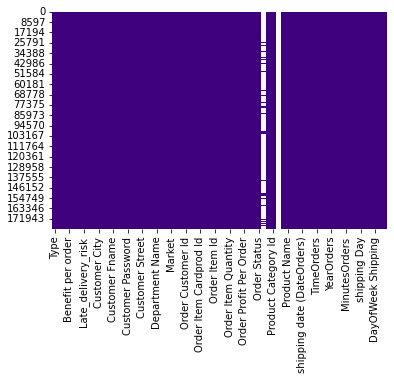

In [93]:
sns.heatmap(data=data.isnull(),cmap='Purples_r',cbar=False)

In [94]:
data.drop(['Product Description','Order Zipcode'],axis=1,inplace=True)

In [95]:
data.drop(['Customer Email','Customer Fname','Customer Lname','Customer Password',
           'Customer Street','Product Image',
          'Product Status'],axis=1,inplace=True)

In [96]:
data

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,HourOrders,MinutesOrders,shipping Date,shipping Time,shipping Day,shipping Month,shipping Year,DayOfWeek Shipping,shipping Hour,shipping Minute
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,22,56,2018-02-03,22:56:00,3,2,2018,Sat,22,56
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,12,27,2018-01-18,12:27:00,18,1,2018,Thu,12,27
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,12,6,2018-01-17,12:06:00,17,1,2018,Wed,12,6
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,11,45,2018-01-16,11:45:00,16,1,2018,Tue,11,45
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,11,24,2018-01-15,11:24:00,15,1,2018,Mon,11,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,40.000000,399.980011,Shipping on time,0,45,Fishing,Brooklyn,...,3,40,2016-01-20,03:40:00,20,1,2016,Wed,3,40
180515,DEBIT,3,2,-613.770019,395.980011,Late delivery,1,45,Fishing,Bakersfield,...,1,34,2016-01-19,01:34:00,19,1,2016,Tue,1,34
180516,TRANSFER,5,4,141.110001,391.980011,Late delivery,1,45,Fishing,Bristol,...,21,0,2016-01-20,21:00:00,20,1,2016,Wed,21,0
180517,PAYMENT,3,4,186.229996,387.980011,Advance shipping,0,45,Fishing,Caguas,...,20,18,2016-01-18,20:18:00,18,1,2016,Mon,20,18


## Drop Missing Data

In [97]:
data.dropna(inplace=True)

<AxesSubplot:>

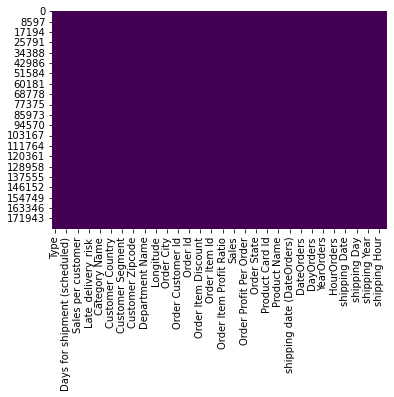

In [98]:
sns.heatmap(data=data.isnull(),cmap='viridis',cbar=False)

In [99]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180516 entries, 0 to 180518
Data columns (total 60 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   Type                           180516 non-null  object        
 1   Days for shipping (real)       180516 non-null  int64         
 2   Days for shipment (scheduled)  180516 non-null  int64         
 3   Benefit per order              180516 non-null  float64       
 4   Sales per customer             180516 non-null  float64       
 5   Delivery Status                180516 non-null  object        
 6   Late_delivery_risk             180516 non-null  int64         
 7   Category Id                    180516 non-null  int64         
 8   Category Name                  180516 non-null  object        
 9   Customer City                  180516 non-null  object        
 10  Customer Country               180516 non-null  object        
 11  

# EDA: Exploratory Data Analysis

In [100]:
data.corr()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,DayOrders,MonthOrders,YearOrders,HourOrders,MinutesOrders,shipping Day,shipping Month,shipping Year,shipping Hour,shipping Minute
Days for shipping (real),1.000000,0.515876,-0.005100,0.001757,0.401428,-0.000345,0.003434,0.000112,-0.001619,-0.004071,...,-0.000485,-0.007591,0.000844,0.016692,-0.005868,-0.004163,-0.005037,0.005416,-0.019609,-0.005868
Days for shipment (scheduled),0.515876,1.000000,-0.000183,0.006446,-0.369342,-0.000371,0.000895,-0.003019,-0.000246,-0.005299,...,-0.000864,-0.007460,0.000655,-0.000855,-0.007037,-0.008132,-0.006173,0.003175,-0.009525,-0.007037
Benefit per order,-0.005100,-0.000183,1.000000,0.133482,-0.003728,0.031883,0.009348,0.002235,0.031439,0.000336,...,0.003492,0.009060,0.010698,-0.000396,-0.002252,0.002701,0.009357,0.010562,0.001562,-0.002252
Sales per customer,0.001757,0.006446,0.133482,1.000000,-0.003793,0.225220,0.060190,-0.001304,0.232396,-0.000219,...,0.035584,0.056923,0.059583,-0.001777,0.002003,0.006602,0.055819,0.060638,-0.000050,0.002003
Late_delivery_risk,0.401428,-0.369342,-0.003728,-0.003793,1.000000,0.001770,0.001501,0.003148,0.001071,0.000682,...,-0.002017,0.002597,-0.002172,0.047035,0.000423,-0.000371,0.003698,-0.000439,-0.043403,0.000423
Category Id,-0.000345,-0.000371,0.031883,0.225220,0.001770,1.000000,0.274575,0.002898,0.888851,0.002165,...,0.003528,0.062401,0.179608,0.001340,0.004345,0.003488,0.053554,0.182089,-0.000113,0.004345
Customer Id,0.003434,0.000895,0.009348,0.060190,0.001501,0.274575,1.000000,0.002022,0.136856,0.002308,...,0.011786,0.050909,0.189726,-0.001525,0.003676,0.004971,0.040855,0.192796,-0.001038,0.003676
Customer Zipcode,0.000112,-0.003019,0.002235,-0.001304,0.003148,0.002898,0.002022,1.000000,0.002878,0.584553,...,0.006988,-0.000686,-0.001212,0.005379,0.002974,0.001986,-0.001540,-0.000774,0.000843,0.002974
Department Id,-0.001619,-0.000246,0.031439,0.232396,0.001071,0.888851,0.136856,0.002878,1.000000,0.002437,...,-0.004422,0.037399,0.095469,-0.000356,0.004123,-0.004092,0.035109,0.095956,-0.001397,0.004123
Latitude,-0.004071,-0.005299,0.000336,-0.000219,0.000682,0.002165,0.002308,0.584553,0.002437,1.000000,...,0.006963,-0.004353,-0.001774,0.001128,-0.001352,-0.001668,-0.004465,-0.001511,-0.000523,-0.001352


<AxesSubplot:>

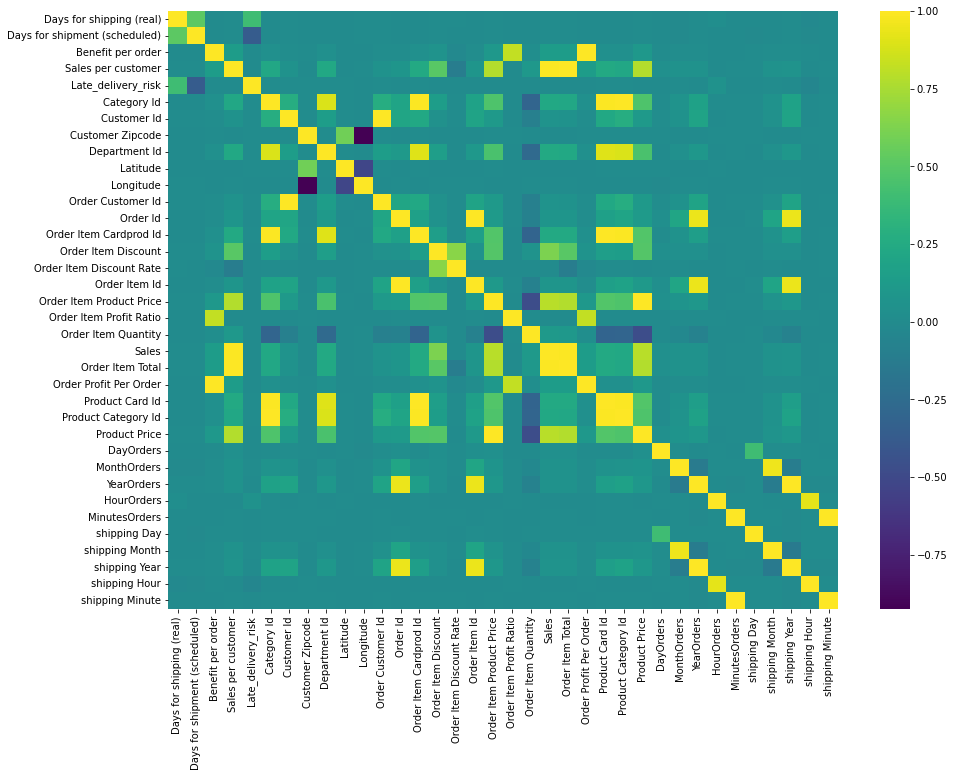

In [101]:
plt.figure(figsize=(15,11))
sns.heatmap(data.corr(),cmap='viridis')

## Auto EDA with Sweetviz

                                             |                                             | [  0%]   00:00 ->…


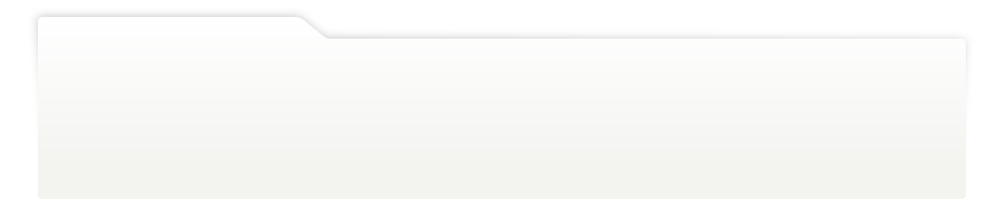
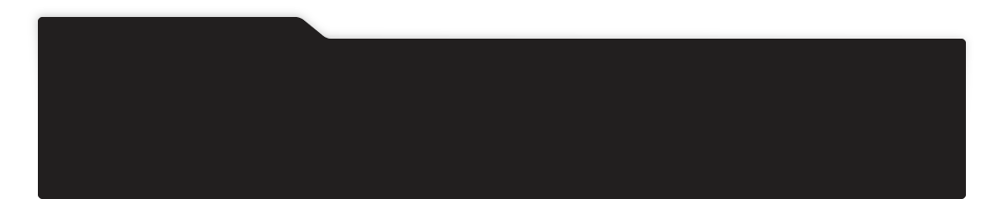
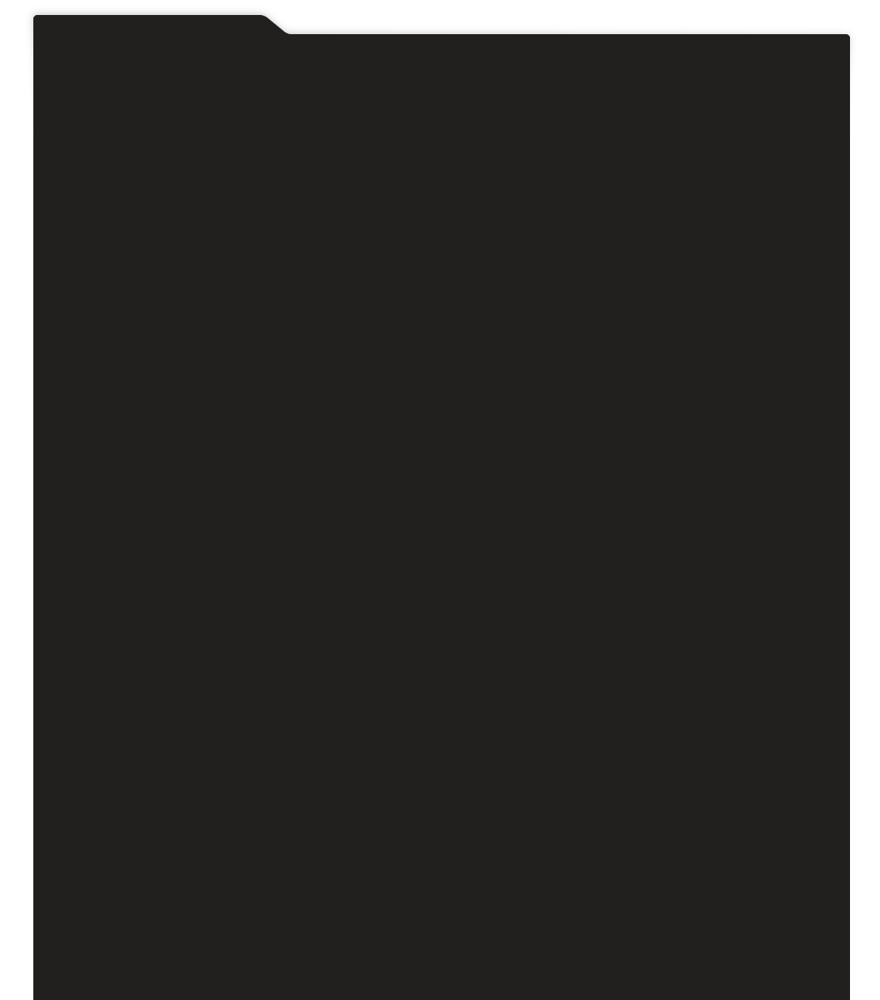
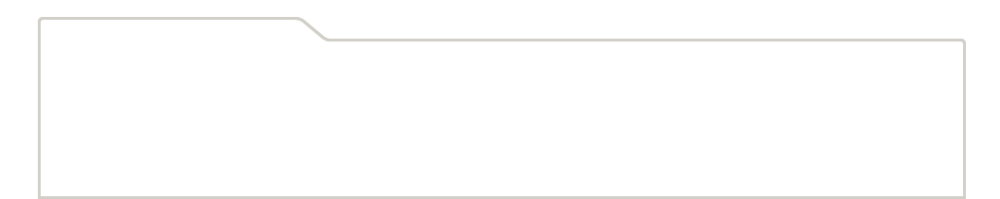
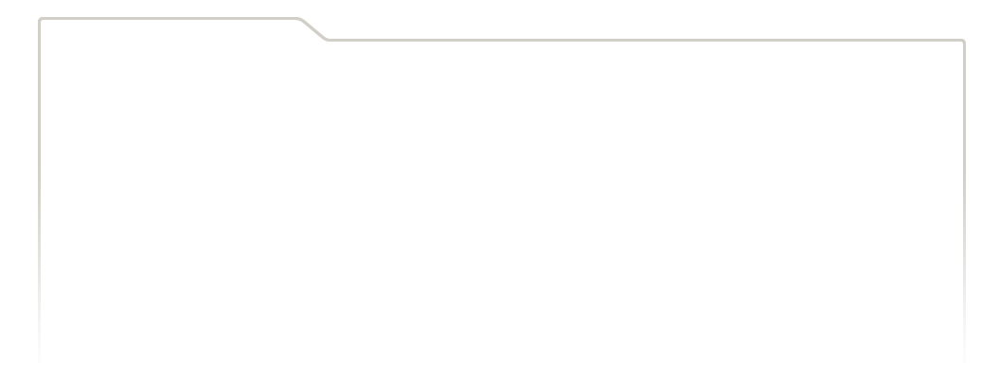
...
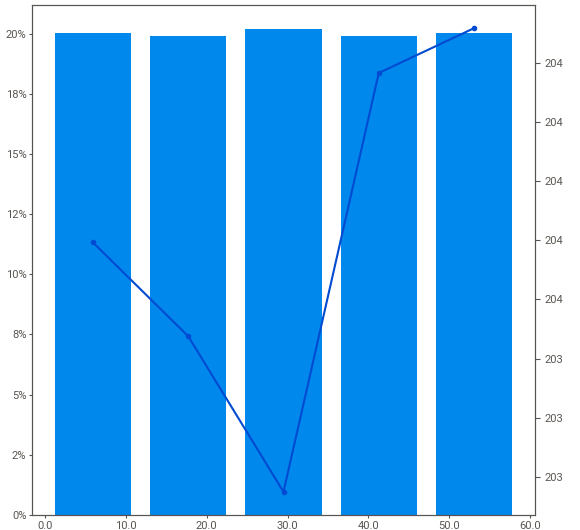
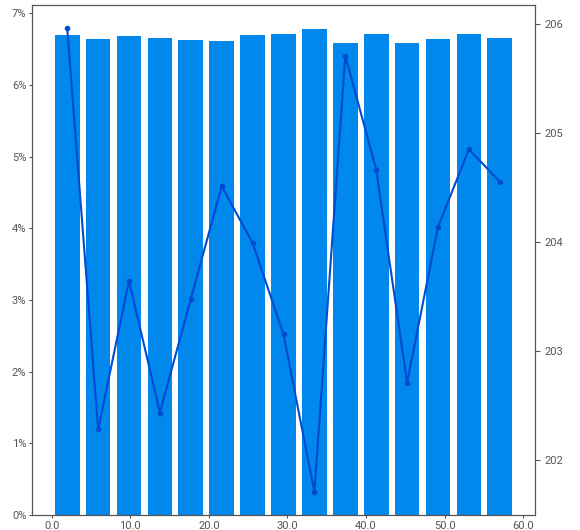
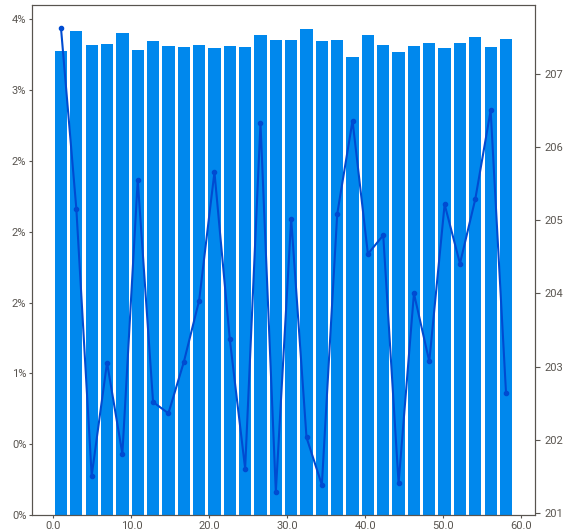
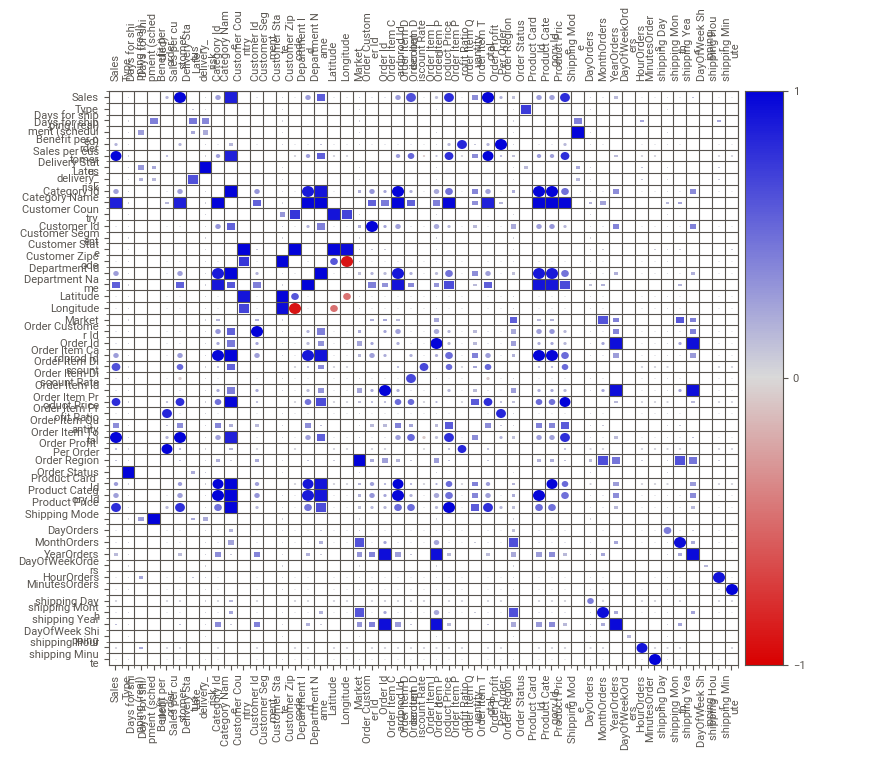
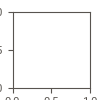

In [102]:
#analyzing the dataset
advert_report = sv.analyze([data,'Online Shop'],target_feat='Sales',pairwise_analysis="on")
#display the report
advert_report.show_notebook(w='100%')

<AxesSubplot:xlabel='Shipping Mode', ylabel='count'>

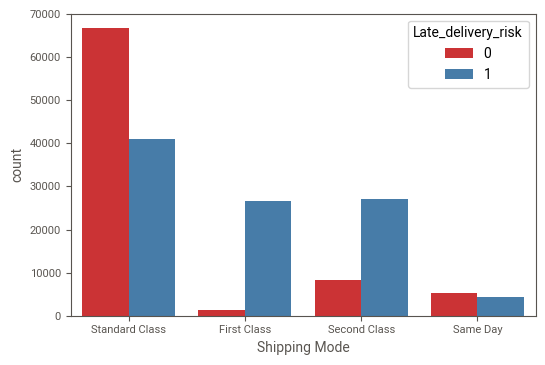

In [103]:
sns.countplot(data=data,x='Shipping Mode',hue='Late_delivery_risk',palette='Set1')

In [104]:
data[data['Delivery Status']=='Shipping canceled']['Type'].value_counts()

TRANSFER    7754
Name: Type, dtype: int64

In [105]:
datasweet = data.copy()
datasweet.drop(['shipping date (DateOrders)','order date (DateOrders)'],inplace=True,axis=1)

                                             |                                             | [  0%]   00:00 ->…


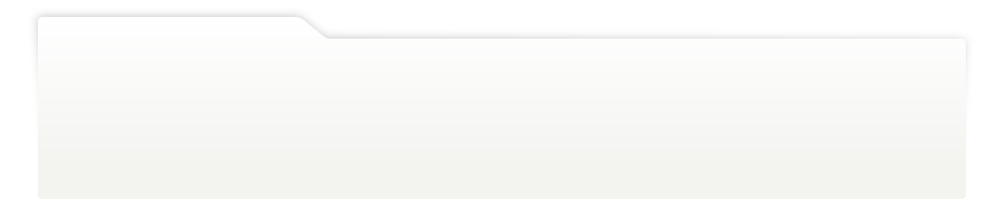
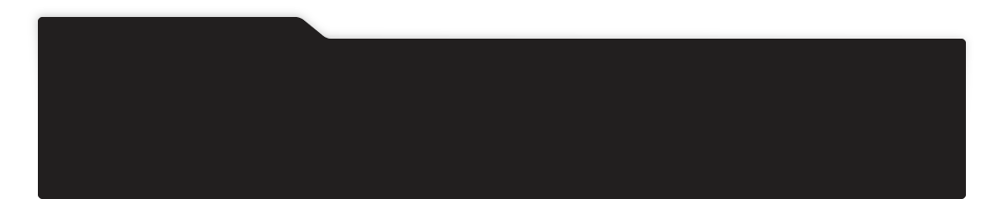
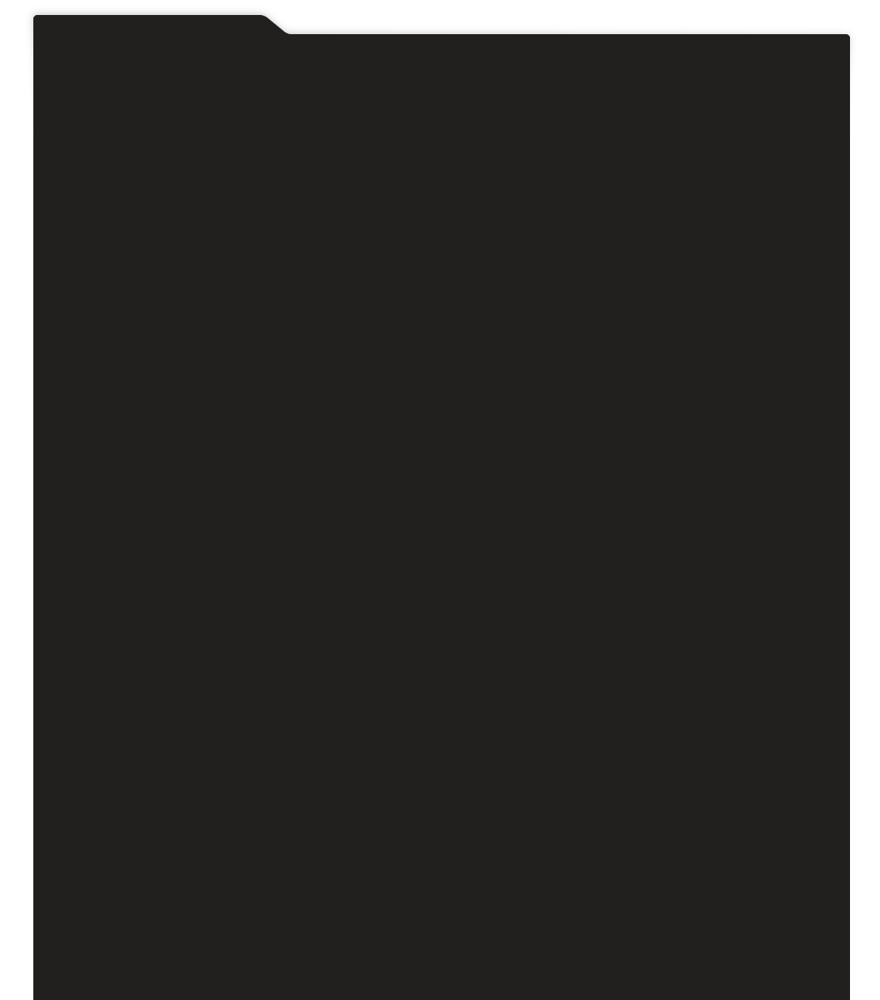
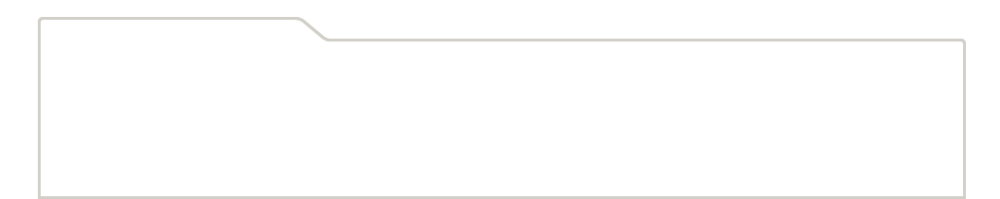
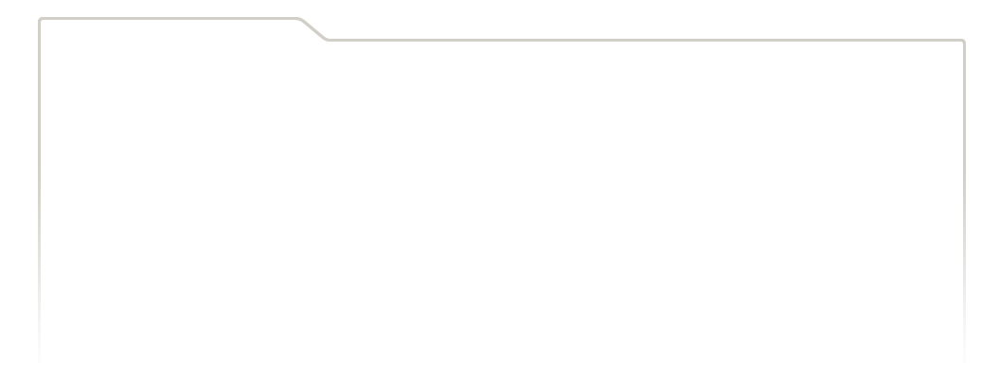
...
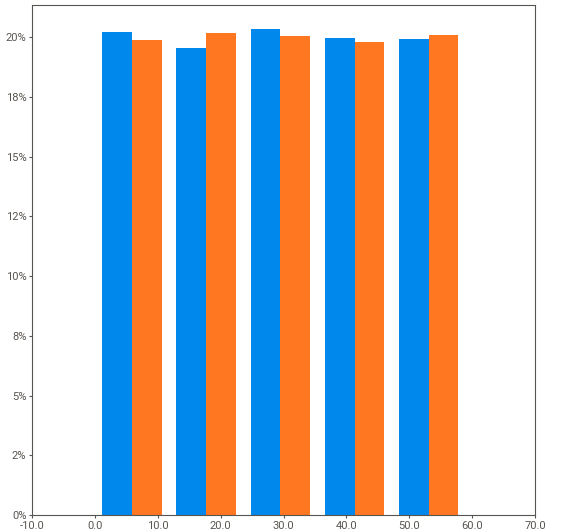
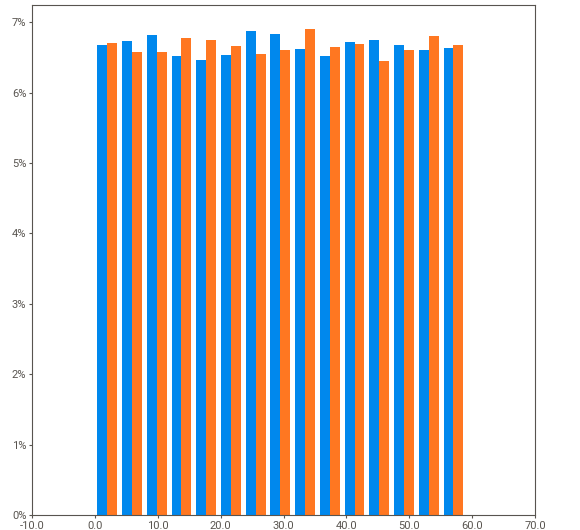
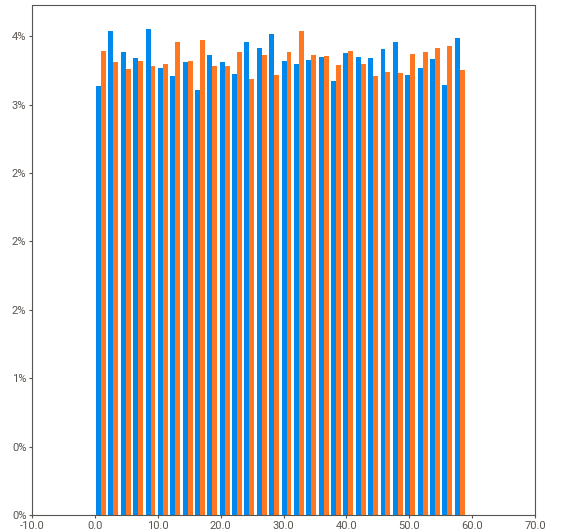
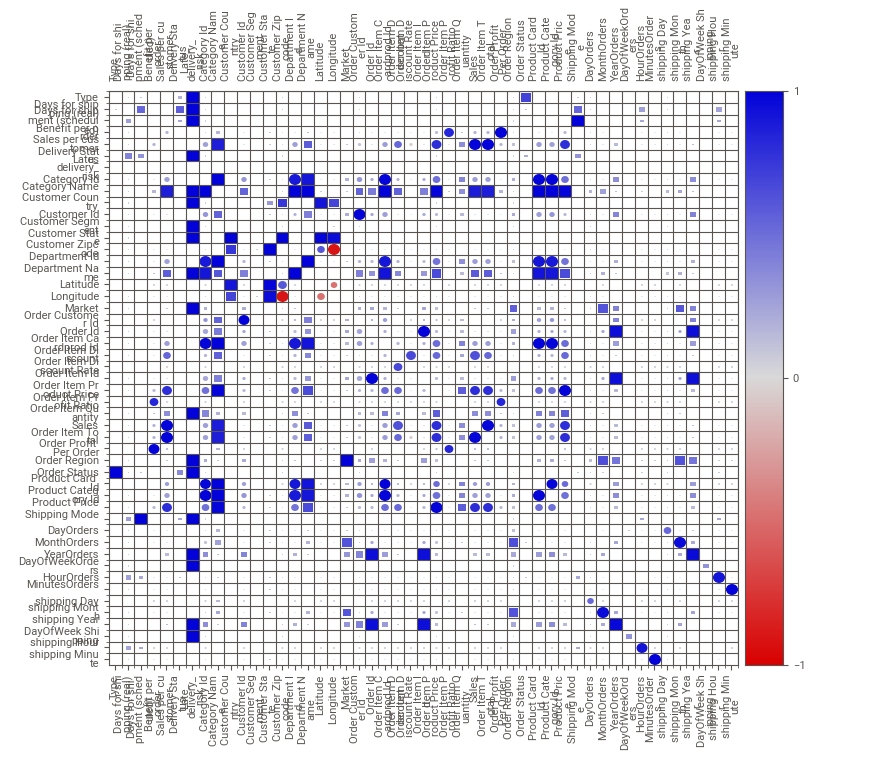
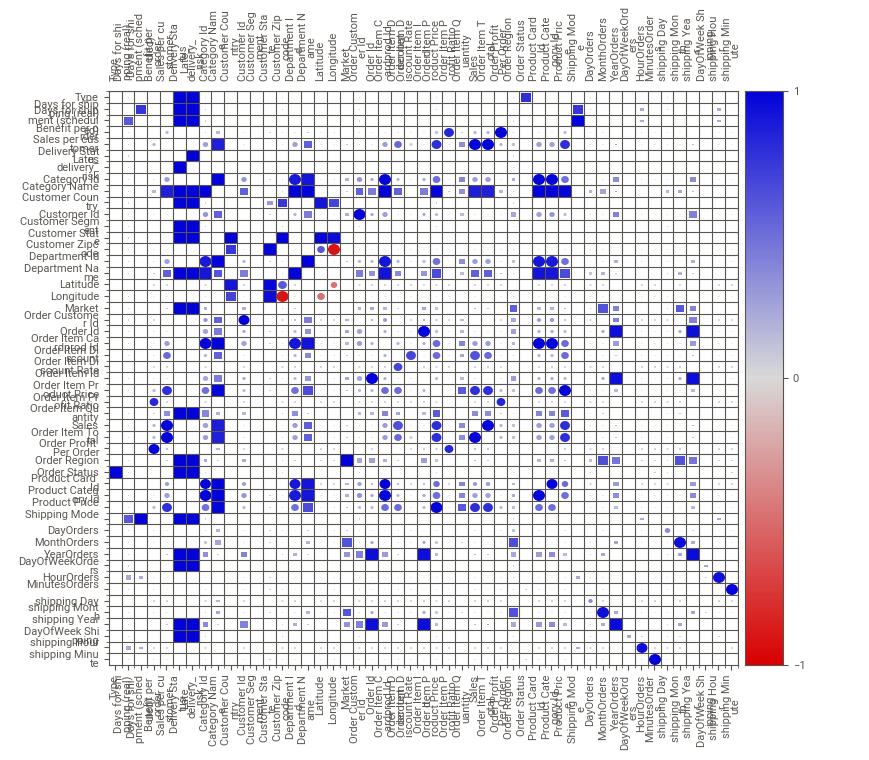

In [106]:
my_report = sv.compare_intra(datasweet, datasweet['Late_delivery_risk'] ==0, ["No Risk", "Risk"])
my_report.show_notebook(w='100%')

# Association Rule Mining: Apriori

In [107]:
df = data.copy()
df.drop(['Days for shipping (real)','Days for shipment (scheduled)','Benefit per order','Sales per customer',
        'Category Id','Customer Id','Customer Zipcode','Department Id','Latitude','Longitude',
        'Order Customer Id','order date (DateOrders)','Order Id','Order Item Cardprod Id','Order Item Discount',
        'Order Item Discount Rate','Order Item Id','Order Item Product Price','Order Item Profit Ratio','Order Item Quantity',
        'Sales','Order Item Total','Order Profit Per Order','Product Card Id','Product Category Id','Product Price',
        'shipping date (DateOrders)','DayOrders','MonthOrders','YearOrders','HourOrders','MinutesOrders','shipping Day',
        'shipping Month','shipping Year','shipping Hour','shipping Minute','Customer State','Department Name',
               'Order State','DateOrders','TimeOrders','shipping Date','shipping Time'],axis=1,inplace=True)

In [108]:
df = pd.get_dummies(df)

In [109]:
df

,Late_delivery_risk,Type_CASH,Type_DEBIT,Type_PAYMENT,Type_TRANSFER,Delivery Status_Advance shipping,Delivery Status_Late delivery,Delivery Status_Shipping canceled,Delivery Status_Shipping on time,Category Name_Accessories,...,DayOfWeekOrders_Thu,DayOfWeekOrders_Tue,DayOfWeekOrders_Wed,DayOfWeek Shipping_Fri,DayOfWeek Shipping_Mon,DayOfWeek Shipping_Sat,DayOfWeek Shipping_Sun,DayOfWeek Shipping_Thu,DayOfWeek Shipping_Tue,DayOfWeek Shipping_Wed
0,0,0,1,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
1,1,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
180515,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
180516,1,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
180517,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [110]:
from mlxtend.frequent_patterns import apriori, association_rules

In [111]:
apriori = apriori(df, min_support = 0.3, use_colnames = True, verbose = 1,low_memory=True)
apriori.sort_values(by='support',ascending=False).head(30)

C:\ProgramData\Anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


Processing 4 combinations | Sampling itemset size 32


,support,itemsets
5,0.615696,(Customer Country_USA)
9,0.596900,(Shipping Mode_Standard Class)
10,0.548295,"(Delivery Status_Late delivery, Late_delivery_..."
0,0.548295,(Late_delivery_risk)
2,0.548295,(Delivery Status_Late delivery)
6,0.517971,(Customer Segment_Consumer)
4,0.384304,(Customer Country_Puerto Rico)
1,0.383861,(Type_DEBIT)
3,0.369884,(Customer City_Caguas)
14,0.369884,"(Customer City_Caguas, Customer Country_Puerto..."


In [112]:
rules = association_rules(apriori, metric = "support", min_threshold = 0.1)
rules.head(20)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Delivery Status_Late delivery),(Late_delivery_risk),0.548295,0.548295,0.548295,1.000000,1.823836,0.247668,inf,1.000000
1,(Late_delivery_risk),(Delivery Status_Late delivery),0.548295,0.548295,0.548295,1.000000,1.823836,0.247668,inf,1.000000
2,(Late_delivery_risk),(Customer Country_USA),0.548295,0.615696,0.337837,0.616159,1.000753,0.000254,1.001207,0.001665
3,(Customer Country_USA),(Late_delivery_risk),0.615696,0.548295,0.337837,0.548708,1.000753,0.000254,1.000914,0.001957
4,(Order Status_COMPLETE),(Type_DEBIT),0.329550,0.383861,0.329550,1.000000,2.605112,0.203049,inf,0.918993
5,(Type_DEBIT),(Order Status_COMPLETE),0.383861,0.329550,0.329550,0.858514,2.605112,0.203049,4.738628,1.000000
6,(Delivery Status_Late delivery),(Customer Country_USA),0.548295,0.615696,0.337837,0.616159,1.000753,0.000254,1.001207,0.001665
7,(Customer Country_USA),(Delivery Status_Late delivery),0.615696,0.548295,0.337837,0.548708,1.000753,0.000254,1.000914,0.001957
8,(Customer City_Caguas),(Customer Country_Puerto Rico),0.369884,0.384304,0.369884,1.000000,2.602107,0.227736,inf,0.977116
9,(Customer Country_Puerto Rico),(Customer City_Caguas),0.384304,0.369884,0.369884,0.962478,2.602107,0.227736,16.793327,1.000000


In [113]:
rules[rules['lift'] >= 1].sort_values(by='lift',ascending=False).head(30)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
4,(Order Status_COMPLETE),(Type_DEBIT),0.329550,0.383861,0.329550,1.000000,2.605112,0.203049,inf,0.918993
5,(Type_DEBIT),(Order Status_COMPLETE),0.383861,0.329550,0.329550,0.858514,2.605112,0.203049,4.738628,1.000000
8,(Customer City_Caguas),(Customer Country_Puerto Rico),0.369884,0.384304,0.369884,1.000000,2.602107,0.227736,inf,0.977116
9,(Customer Country_Puerto Rico),(Customer City_Caguas),0.384304,0.369884,0.369884,0.962478,2.602107,0.227736,16.793327,1.000000
0,(Delivery Status_Late delivery),(Late_delivery_risk),0.548295,0.548295,0.548295,1.000000,1.823836,0.247668,inf,1.000000
20,(Late_delivery_risk),"(Delivery Status_Late delivery, Customer Count...",0.548295,0.337837,0.337837,0.616159,1.823836,0.152603,1.725099,1.000000
19,(Delivery Status_Late delivery),"(Late_delivery_risk, Customer Country_USA)",0.548295,0.337837,0.337837,0.616159,1.823836,0.152603,1.725099,1.000000
18,"(Late_delivery_risk, Customer Country_USA)",(Delivery Status_Late delivery),0.337837,0.548295,0.337837,1.000000,1.823836,0.152603,inf,0.682166
17,"(Delivery Status_Late delivery, Customer Count...",(Late_delivery_risk),0.337837,0.548295,0.337837,1.000000,1.823836,0.152603,inf,0.682166
1,(Late_delivery_risk),(Delivery Status_Late delivery),0.548295,0.548295,0.548295,1.000000,1.823836,0.247668,inf,1.000000


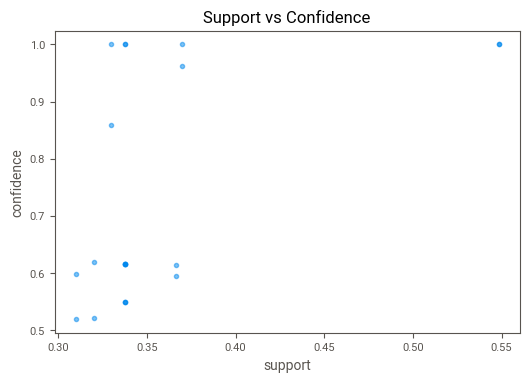

In [114]:
plt.scatter(rules['support'], rules['confidence'], alpha=0.5)
plt.xlabel('support')
plt.ylabel('confidence')
plt.title('Support vs Confidence')
plt.show()

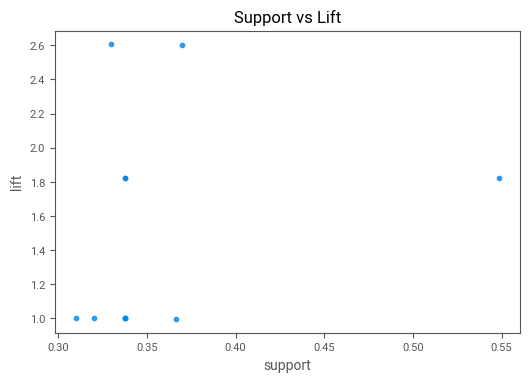

In [115]:
plt.scatter(rules['support'], rules['lift'], alpha=0.5)
plt.xlabel('support')
plt.ylabel('lift')
plt.title('Support vs Lift')
plt.show()

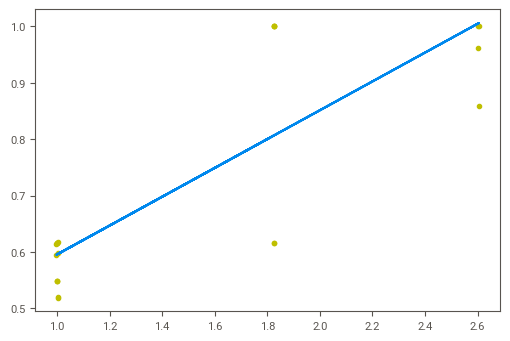

In [116]:
fit = np.polyfit(rules['lift'], rules['confidence'], 1)
fit_fn = np.poly1d(fit)
plt.plot(rules['lift'], rules['confidence'], 'yo', rules['lift'], 
 fit_fn(rules['lift']))

# Build Dataset For Predicting

In [117]:
data.drop(['Product Name','Category Name','Department Name','shipping date (DateOrders)',
           'order date (DateOrders)'],axis=1,inplace=True)

In [118]:
data = pd.get_dummies(data,columns=['Type','Delivery Status','Customer Country','Market','Shipping Mode'],drop_first=True)
data

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer City,Customer Id,Customer Segment,Customer State,...,Delivery Status_Shipping canceled,Delivery Status_Shipping on time,Customer Country_USA,Market_Europe,Market_LATAM,Market_Pacific Asia,Market_USCA,Shipping Mode_Same Day,Shipping Mode_Second Class,Shipping Mode_Standard Class
0,3,4,91.250000,314.640015,0,73,Caguas,20755,Consumer,PR,...,0,0,0,0,0,1,0,0,0,1
1,5,4,-249.089996,311.359985,1,73,Caguas,19492,Consumer,PR,...,0,0,0,0,0,1,0,0,0,1
2,4,4,-247.779999,309.720001,0,73,San Jose,19491,Consumer,CA,...,0,1,1,0,0,1,0,0,0,1
3,3,4,22.860001,304.809998,0,73,Los Angeles,19490,Home Office,CA,...,0,0,1,0,0,1,0,0,0,1
4,2,4,134.210007,298.250000,0,73,Caguas,19489,Corporate,PR,...,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,4,4,40.000000,399.980011,0,45,Brooklyn,1005,Home Office,NY,...,0,1,1,0,0,1,0,0,0,1
180515,3,2,-613.770019,395.980011,1,45,Bakersfield,9141,Corporate,CA,...,0,0,1,0,0,1,0,0,1,0
180516,5,4,141.110001,391.980011,1,45,Bristol,291,Corporate,CT,...,0,0,1,0,0,1,0,0,0,1
180517,3,4,186.229996,387.980011,0,45,Caguas,2813,Consumer,PR,...,0,0,0,0,0,1,0,0,0,1


## Hash Encoding

In [119]:
enc = HashingEncoder(verbose=1,n_components=8,max_process=1)

In [120]:
data_CCity = enc.fit_transform(data['Customer City'],axis=1)

In [121]:
data_CCity

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7
0,1,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
180514,0,0,0,1,0,0,0,0
180515,0,0,0,0,0,0,1,0
180516,1,0,0,0,0,0,0,0
180517,1,0,0,0,0,0,0,0


In [122]:
data_CCity.rename(columns={'col_0':'CCity_1','col_1':'CCity_2','col_2':'CCity_3',
                          'col_3':'CCity_4','col_4':'CCity_5','col_5':'CCity_6',
                           'col_6':'CCity_7','col_7':'CCity_8'
                          },inplace=True)

In [123]:
data_CCity

,CCity_1,CCity_2,CCity_3,CCity_4,CCity_5,CCity_6,CCity_7,CCity_8
0,1,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
180514,0,0,0,1,0,0,0,0
180515,0,0,0,0,0,0,1,0
180516,1,0,0,0,0,0,0,0
180517,1,0,0,0,0,0,0,0


In [124]:
dmap = {'Consumer':1,'Corporate':2,'Home Office':3}
data['Customer Segment'] = data['Customer Segment'].map(dmap)

In [125]:
data_CState = enc.fit_transform(data['Customer State'],axis=1)

In [126]:
data_CState.rename(columns={'col_0':'CState_1','col_1':'CState_2','col_2':'CState_3',
                          'col_3':'CState_4','col_4':'CState_5','col_5':'CState_6',
                           'col_6':'CState_7','col_7':'CState_8'
                          },inplace=True)

In [127]:
data_CState

,CState_1,CState_2,CState_3,CState_4,CState_5,CState_6,CState_7,CState_8
0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,1,0
2,0,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...
180514,1,0,0,0,0,0,0,0
180515,0,1,0,0,0,0,0,0
180516,0,0,0,0,0,1,0,0
180517,0,0,0,0,0,0,1,0


In [128]:
data_OCity = enc.fit_transform(data['Order City'],axis=1)

In [129]:
data_OCity.rename(columns={'col_0':'OCity_1','col_1':'OCity_2','col_2':'OCity_3',
                          'col_3':'OCity_4','col_4':'OCity_5','col_5':'OCity_6',
                           'col_6':'OCity_7','col_7':'OCity_8'
                          },inplace=True)

In [130]:
data_OCity

,OCity_1,OCity_2,OCity_3,OCity_4,OCity_5,OCity_6,OCity_7,OCity_8
0,0,0,0,0,0,0,1,0
1,0,0,0,0,1,0,0,0
2,0,0,0,0,1,0,0,0
3,0,0,0,0,1,0,0,0
4,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...
180514,0,0,0,1,0,0,0,0
180515,0,0,0,0,0,1,0,0
180516,0,0,0,0,0,0,0,1
180517,0,0,0,0,0,0,0,1


In [131]:
data_OCountry = enc.fit_transform(data['Order Country'],axis=1)

In [132]:
data_OCountry.rename(columns={'col_0':'OCountry_1','col_1':'OCountry_2','col_2':'OCountry_3',
                          'col_3':'OCountry_4','col_4':'OCountry_5','col_5':'OCountry_6',
                           'col_6':'OCountry_7','col_7':'OCountry_8'
                          },inplace=True)

In [133]:
data_OCountry

,OCountry_1,OCountry_2,OCountry_3,OCountry_4,OCountry_5,OCountry_6,OCountry_7,OCountry_8
0,0,1,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0
2,0,0,0,1,0,0,0,0
3,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...
180514,0,0,1,0,0,0,0,0
180515,0,0,0,0,1,0,0,0
180516,0,0,0,0,0,1,0,0
180517,0,0,0,0,0,1,0,0


In [134]:
data_ORegion = enc.fit_transform(data['Order Region'],axis=1)

In [135]:
data_ORegion.rename(columns={'col_0':'ORegion_1','col_1':'ORegion_2','col_2':'ORegion_3',
                          'col_3':'ORegion_4','col_4':'ORegion_5','col_5':'ORegion_6',
                           'col_6':'ORegion_7','col_7':'ORegion_8'
                          },inplace=True)

In [136]:
data_ORegion

,ORegion_1,ORegion_2,ORegion_3,ORegion_4,ORegion_5,ORegion_6,ORegion_7,ORegion_8
0,0,0,1,0,0,0,0,0
1,0,0,0,1,0,0,0,0
2,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...
180514,0,0,0,0,1,0,0,0
180515,0,0,0,0,1,0,0,0
180516,0,0,0,0,0,0,0,1
180517,0,0,0,0,0,0,0,1


In [137]:
data_OState = enc.fit_transform(data['Order State'],axis=1)

In [138]:
data_OState.rename(columns={'col_0':'OState_1','col_1':'OState_2','col_2':'OState_3',
                          'col_3':'OState_4','col_4':'OState_5','col_5':'OState_6',
                           'col_6':'OState_7','col_7':'OState_8'
                          },inplace=True)

In [139]:
data_OState

,OState_1,OState_2,OState_3,OState_4,OState_5,OState_6,OState_7,OState_8
0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0
2,0,0,0,0,0,1,0,0
3,0,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
180514,0,0,0,1,0,0,0,0
180515,0,0,0,1,0,0,0,0
180516,0,1,0,0,0,0,0,0
180517,0,1,0,0,0,0,0,0


In [140]:
enc = HashingEncoder(verbose=1,n_components=3,max_process=1)

In [141]:
data_OStatus = enc.fit_transform(data['Order Status'],axis=1)

In [142]:
data_OStatus.rename(columns={'col_0':'OStatus_1','col_1':'OStatus_2','col_2':'OStatus_3'},inplace=True)

In [143]:
data_OStatus

,OStatus_1,OStatus_2,OStatus_3
0,0,0,1
1,0,1,0
2,0,1,0
3,0,0,1
4,0,1,0
...,...,...,...
180514,0,1,0
180515,0,0,1
180516,0,1,0
180517,0,1,0


In [144]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180516 entries, 0 to 180518
Data columns (total 64 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Days for shipping (real)           180516 non-null  int64  
 1   Days for shipment (scheduled)      180516 non-null  int64  
 2   Benefit per order                  180516 non-null  float64
 3   Sales per customer                 180516 non-null  float64
 4   Late_delivery_risk                 180516 non-null  int64  
 5   Category Id                        180516 non-null  int64  
 6   Customer City                      180516 non-null  object 
 7   Customer Id                        180516 non-null  int64  
 8   Customer Segment                   180516 non-null  int64  
 9   Customer State                     180516 non-null  object 
 10  Customer Zipcode                   180516 non-null  float64
 11  Department Id                      1805

In [145]:
temp = data[['Days for shipping (real)','Days for shipment (scheduled)','Benefit per order','Sales per customer',
     'Late_delivery_risk','Category Id','Customer Id','Customer Zipcode','Department Id','Latitude','Longitude',
     'Order Customer Id','Order Id','Order Item Cardprod Id','Order Item Discount','Order Item Discount Rate',
     'Order Item Id','Order Item Product Price','Order Item Profit Ratio','Order Item Quantity','Order Item Total',
     'Order Profit Per Order','Product Card Id','Product Category Id','Product Price','DayOrders','MonthOrders',
     'YearOrders','HourOrders','MinutesOrders','shipping Day','shipping Month','shipping Year','shipping Hour','shipping Minute',
     'Type_DEBIT','Type_PAYMENT','Type_TRANSFER','Delivery Status_Late delivery','Delivery Status_Shipping canceled',
     'Delivery Status_Shipping on time','Customer Country_USA','Market_Europe','Market_LATAM','Market_Pacific Asia',
     'Market_USCA','Shipping Mode_Same Day','Shipping Mode_Second Class','Shipping Mode_Standard Class','Customer Segment','Sales']]

In [146]:
data = pd.concat((data_CCity,data_CState,data_OCity,data_OCountry,data_ORegion,data_OState,data_OStatus,temp),axis=1)

In [147]:
data

,CCity_1,CCity_2,CCity_3,CCity_4,CCity_5,CCity_6,CCity_7,CCity_8,CState_1,CState_2,...,Customer Country_USA,Market_Europe,Market_LATAM,Market_Pacific Asia,Market_USCA,Shipping Mode_Same Day,Shipping Mode_Second Class,Shipping Mode_Standard Class,Customer Segment,Sales
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,327.750000
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,327.750000
2,0,0,0,0,1,0,0,0,0,1,...,1,0,0,1,0,0,0,1,1,327.750000
3,0,0,0,0,0,1,0,0,0,1,...,1,0,0,1,0,0,0,1,3,327.750000
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,2,327.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,0,0,0,1,0,0,0,0,1,0,...,1,0,0,1,0,0,0,1,3,399.980011
180515,0,0,0,0,0,0,1,0,0,1,...,1,0,0,1,0,0,1,0,2,399.980011
180516,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,2,399.980011
180517,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,399.980011


In [148]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180516 entries, 0 to 180518
Columns: 102 entries, CCity_1 to Sales
dtypes: float64(13), int64(75), uint8(14)
memory usage: 125.0 MB


# Train Valid Test Split

**Train Dataset:**

Set of data used for learning (by the model), that is, to fit the parameters to the machine learning model

**Valid Dataset:**

Set of data used to provide an unbiased evaluation of a model fitted on the training dataset while tuning model hyperparameters.
Also play a role in other forms of model preparation, such as feature selection, threshold cut-off selection.

**Test Dataset:**

Set of data used to provide an unbiased evaluation of a final model fitted on the training dataset.

In [149]:
from fast_ml.model_development import train_valid_test_split

In [150]:
X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(data, target = 'Sales', 
                                                                            train_size=0.7, valid_size=0.1, test_size=0.2)

print(X_train.shape), print(y_train.shape)
print(X_valid.shape), print(y_valid.shape)
print(X_test.shape), print(y_test.shape)

(126361, 101)
(126361,)
(18051, 101)
(18051,)
(36104, 101)
(36104,)


(None, None)

# Sale Prediction

## Linear Regression

In [151]:
from sklearn.linear_model import LinearRegression

In [152]:
lr = LinearRegression()

In [153]:
lr.fit(X_train,y_train)

LinearRegression()

In [154]:
pred = lr.predict(X_valid)

### Evaluation

**Mean Absolute Error:** (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

**Mean Squared Error:** (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

**Root Mean Squared Error:** (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

**R² Score:** R² score also known as the coefficient of determination gives the measure of how good a model fits to a given dataset. It indicates how closer are the predicted values to the actual values:

$$1-(\sum_{i=1}^n(y_i-\hat{y}_i) / \sum_{i=1}^n(y_i-\bar{y}_i)^2)$$


**Adjusted R² Score:** Adjusted R² is a modified form of R² that penalizes the addition of new independent variable or predictor and only increases if the new independent variable or predictor enhances the model performance:

$$1-((1-R^2) * ((n-1)  /  (n-k-1)))$$

R² : It is R² Score

n : Number of Samples in our Dataset

k : Number of Predictors

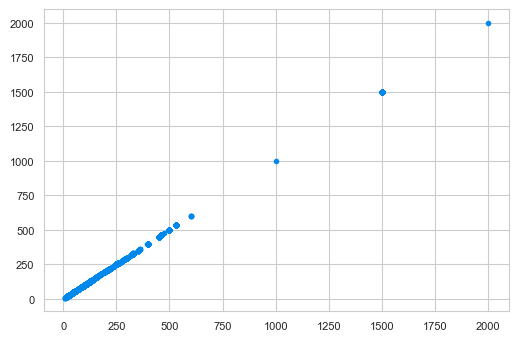

In [155]:
sns.set_style('whitegrid')
plt.scatter(y_valid,pred)

In [156]:
def adjusted_r2_score(actual, predictions, num_pred, num_samples):
    n = num_samples
    k = num_pred
    r2 = metrics.r2_score(actual, predictions)
    adjusted_r2 = 1 - ((1-r2) * ((n-1)/(n-k-1)))
    return adjusted_r2

In [157]:
num_samples = X_valid.shape[0]
num_predictors = X_valid.shape[1]

In [158]:
from sklearn import metrics
print('Score:',lr.score(X_valid,y_valid))
print('MAE:', metrics.mean_absolute_error(y_valid,pred))
print('MSE:', metrics.mean_squared_error(y_valid,pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_valid,pred)))
print('R² Score:',metrics.r2_score(y_valid, pred))
print('Adjusted R² Score:',adjusted_r2_score(y_valid, pred, num_predictors, num_samples))

Score: 0.9999999998772037
MAE: 0.0005793220801803775
MSE: 2.213011052947711e-06
RMSE: 0.0014876192567144695
R² Score: 0.9999999998772037
Adjusted R² Score: 0.9999999998765127


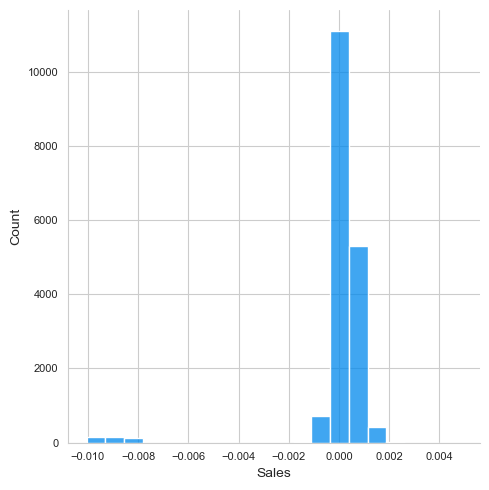

In [159]:
sns.displot((y_valid - pred), bins=20)

<AxesSubplot:xlabel='Sales', ylabel='Density'>

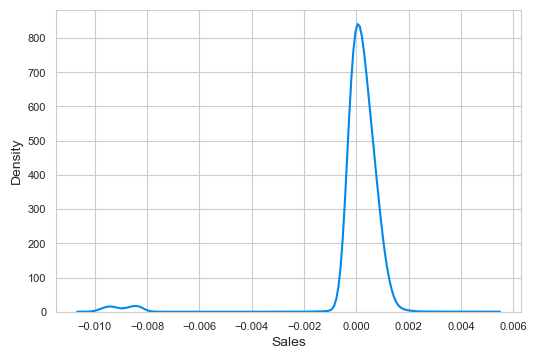

In [160]:
sns.kdeplot((y_valid - pred))

In [161]:
coeff_dt = pd.DataFrame(lr.coef_,X_train.columns,columns=['Coefficient']).sort_values(by='Coefficient',ascending=False)
import pandas as pd; import numpy as np
coeff_dt = coeff_dt.reset_index()
coeff_dt

,index,Coefficient
0,Order Item Discount,0.999985
1,Sales per customer,0.500000
2,Order Item Total,0.500000
3,shipping Year,0.000245
4,OCountry_3,0.000090
...,...,...
96,ORegion_5,-0.000057
97,Customer Country_USA,-0.000062
98,MonthOrders,-0.000354
99,Order Item Discount Rate,-0.001929


## Ridge Regression

In [162]:
from sklearn.linear_model import Ridge

In [163]:
ridge = Ridge(alpha=1.0, random_state=101)

In [164]:
ridge.fit(X_train, y_train)

Ridge(random_state=101)

In [165]:
pred = ridge.predict(X_valid)

### Evaluation

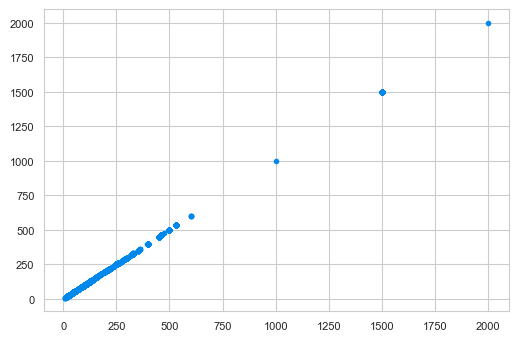

In [166]:
sns.set_style('whitegrid')
plt.scatter(y_valid,pred)

In [167]:
print('Score:',ridge.score(X_valid,y_valid))
print('MAE:', metrics.mean_absolute_error(y_valid,pred))
print('MSE:', metrics.mean_squared_error(y_valid,pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_valid,pred)))
print('R² Score:',metrics.r2_score(y_valid, pred))
print('Adjusted R² Score:',adjusted_r2_score(y_valid, pred, num_predictors, num_samples))

Score: 0.9999999998772109
MAE: 0.0005791769984641409
MSE: 2.2128816435192384e-06
RMSE: 0.0014875757605981748
R² Score: 0.9999999998772109
Adjusted R² Score: 0.99999999987652


<AxesSubplot:xlabel='Sales', ylabel='Density'>

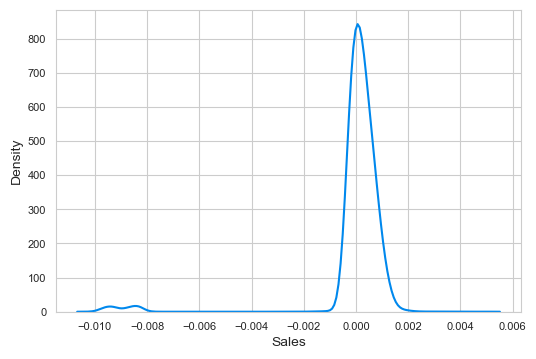

In [168]:
sns.kdeplot((y_valid - pred))

In [169]:
coeff_dt = pd.DataFrame(ridge.coef_,X_train.columns,columns=['Coefficient']).sort_values(by='Coefficient',ascending=False)
coeff_dt = coeff_dt.reset_index()
coeff_dt

,index,Coefficient
0,Order Item Discount,0.999984
1,Order Item Total,0.500001
2,Sales per customer,0.500000
3,OCountry_3,0.000088
4,Market_USCA,0.000074
...,...,...
96,Customer Country_USA,-0.000062
97,MonthOrders,-0.000065
98,shipping Year,-0.000719
99,YearOrders,-0.000871


## Lasso Regression

In [170]:
from sklearn import linear_model

In [171]:
lasso = linear_model.Lasso(alpha=0.1)

In [172]:
lasso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [173]:
pred = lasso.predict(X_valid)

### Evaluation

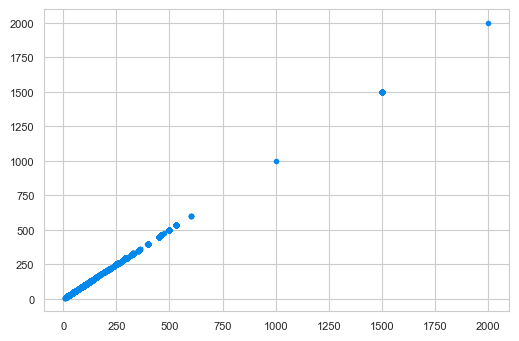

In [174]:
sns.set_style('whitegrid')
plt.scatter(y_valid,pred)

In [175]:
print('Score:',lasso.score(X_valid,y_valid))
print('MAE:', metrics.mean_absolute_error(y_valid,pred))
print('MSE:', metrics.mean_squared_error(y_valid,pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_valid,pred)))
print('R² Score:',metrics.r2_score(y_valid, pred))
print('Adjusted R² Score:',adjusted_r2_score(y_valid, pred, num_predictors, num_samples))

Score: 0.9999999763087593
MAE: 0.013241754745279301
MSE: 0.0004269589791022858
RMSE: 0.02066298572574365
R² Score: 0.9999999763087593
Adjusted R² Score: 0.9999999761754473


<AxesSubplot:xlabel='Sales', ylabel='Density'>

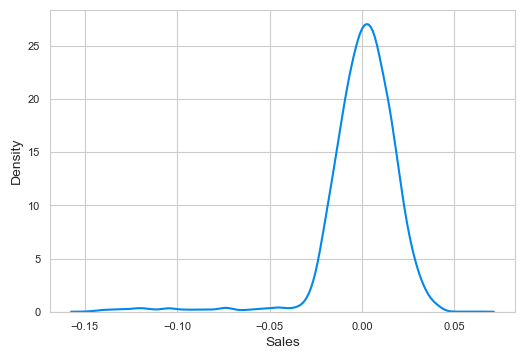

In [176]:
sns.kdeplot((y_valid - pred))

In [177]:
coeff_dt = pd.DataFrame(lasso.coef_,X_train.columns,columns=['Coefficient']).sort_values(by='Coefficient',ascending=False)
coeff_dt = coeff_dt.reset_index()
coeff_dt

,index,Coefficient
0,Sales per customer,1.050423
1,Order Item Discount,0.999711
2,Benefit per order,0.153694
3,Product Price,0.039230
4,Product Card Id,0.004288
...,...,...
96,Order Item Id,-0.000017
97,Order Item Cardprod Id,-0.004311
98,Order Item Product Price,-0.039212
99,Order Item Total,-0.050404


## Decision Tree Regression

In [178]:
from sklearn.tree import DecisionTreeRegressor

In [179]:
dtr = DecisionTreeRegressor(random_state=101)

In [180]:
dtr.fit(X_train,y_train)

DecisionTreeRegressor(random_state=101)

In [181]:
pred = dtr.predict(X_valid)

### Evaluation

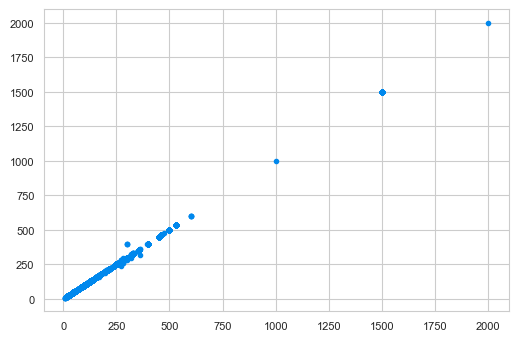

In [182]:
sns.set_style('whitegrid')
plt.scatter(y_valid,pred)

In [183]:
print('Score:',dtr.score(X_valid,y_valid))
print('MAE:', metrics.mean_absolute_error(y_valid,pred))
print('MSE:', metrics.mean_squared_error(y_valid,pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_valid,pred)))
print('R² Score:',metrics.r2_score(y_valid, pred))
print('Adjusted R² Score:',adjusted_r2_score(y_valid, pred, num_predictors, num_samples))

Score: 0.9998913147681271
MAE: 0.031979393545458236
MSE: 1.958704318753283
RMSE: 1.399537180196826
R² Score: 0.9998913147681271
Adjusted R² Score: 0.9998907031904114


<AxesSubplot:xlabel='Sales', ylabel='Density'>

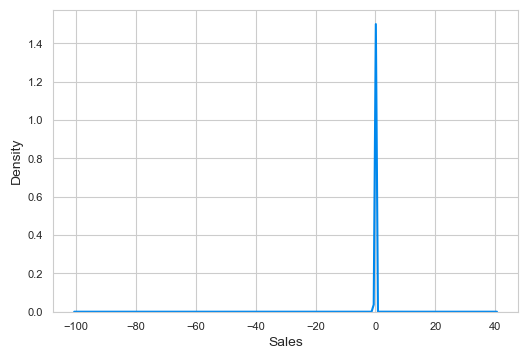

In [184]:
sns.kdeplot((y_valid - pred))

## Random Forest Regression

In [185]:
from sklearn.ensemble import RandomForestRegressor

In [186]:
rfr = RandomForestRegressor(max_depth=2, random_state=101)

In [187]:
rfr.fit(X_train, y_train)

RandomForestRegressor(max_depth=2, random_state=101)

In [188]:
pred = rfr.predict(X_valid)

### Evaluation

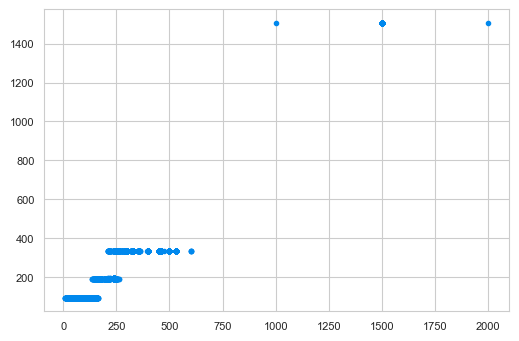

In [189]:
sns.set_style('whitegrid')
plt.scatter(y_valid,pred)

In [190]:
print('Score:',rfr.score(X_valid,y_valid))
print('MAE:', metrics.mean_absolute_error(y_valid,pred))
print('MSE:', metrics.mean_squared_error(y_valid,pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_valid,pred)))
print('R² Score:',metrics.r2_score(y_valid, pred))
print('Adjusted R² Score:',adjusted_r2_score(y_valid, pred, num_predictors, num_samples))

Score: 0.864691031284581
MAE: 38.927702238770664
MSE: 2438.512177062186
RMSE: 49.38129379696512
R² Score: 0.864691031284581
Adjusted R² Score: 0.8639296403524813


<AxesSubplot:xlabel='Sales', ylabel='Density'>

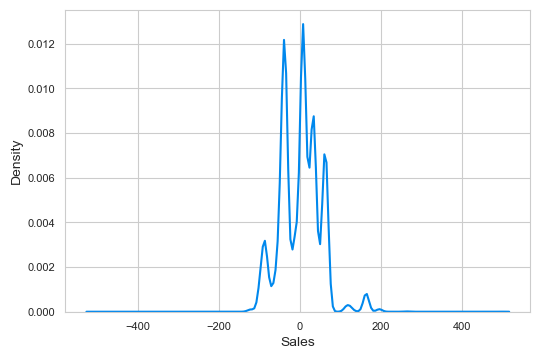

In [191]:
sns.kdeplot((y_valid - pred))

## Bayesian Regression

In [192]:
from sklearn import linear_model

In [193]:
brr = linear_model.BayesianRidge()

In [194]:
brr.fit(X_train,y_train)

BayesianRidge()

In [195]:
pred = brr.predict(X_valid)

### Evaluation

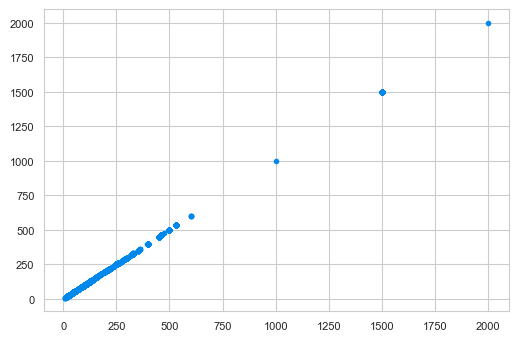

In [196]:
plt.scatter(y_valid,pred)

In [197]:
print('Score:',brr.score(X_valid,y_valid))
print('MAE:', metrics.mean_absolute_error(y_valid,pred))
print('MSE:', metrics.mean_squared_error(y_valid,pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_valid,pred)))
print('R² Score:',metrics.r2_score(y_valid, pred))
print('Adjusted R² Score:',adjusted_r2_score(y_valid, pred, num_predictors, num_samples))

Score: 0.9999999998772037
MAE: 0.0005793220331261513
MSE: 2.2130108041557012e-06
RMSE: 0.0014876191730936051
R² Score: 0.9999999998772037
Adjusted R² Score: 0.9999999998765127


<AxesSubplot:xlabel='Sales', ylabel='Density'>

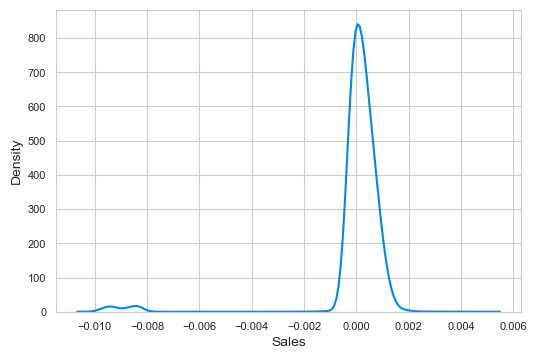

In [198]:
sns.kdeplot((y_valid - pred))

In [199]:
coeff_dt = pd.DataFrame(brr.coef_,X_train.columns,columns=['Coefficient']).sort_values(by='Coefficient',ascending=False)
coeff_dt = coeff_dt.reset_index()
coeff_dt

,index,Coefficient
0,Order Item Discount,0.999985
1,Sales per customer,0.513407
2,Order Item Total,0.486593
3,CCity_6,0.058592
4,CCity_3,0.058565
...,...,...
96,Order Profit Per Order,-0.003951
97,YearOrders,-0.004336
98,Order Item Product Price,-0.005886
99,Order Item Cardprod Id,-0.006561


# Test Models

In [200]:
X_trainValid = pd.concat([X_train,X_valid],axis=0)

In [201]:
X_trainValid

,CCity_1,CCity_2,CCity_3,CCity_4,CCity_5,CCity_6,CCity_7,CCity_8,CState_1,CState_2,...,Delivery Status_Shipping on time,Customer Country_USA,Market_Europe,Market_LATAM,Market_Pacific Asia,Market_USCA,Shipping Mode_Same Day,Shipping Mode_Second Class,Shipping Mode_Standard Class,Customer Segment
57540,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1
33860,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,1,1
103781,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,2
141638,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,3
68069,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38178,0,0,0,1,0,0,0,0,0,1,...,0,1,0,0,1,0,0,1,0,1
25905,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,2
13855,0,0,0,0,0,0,0,1,0,1,...,1,1,1,0,0,0,0,0,1,2
154978,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1


In [202]:
y_trainValid = pd.concat([y_train,y_valid],axis=0)

In [203]:
y_trainValid

57540     239.960007
33860      84.400002
103781    199.990005
141638    250.000000
68069     200.000000
             ...    
38178     250.000000
25905     119.980003
13855     150.000000
154978    119.970001
25774     199.949997
Name: Sales, Length: 144412, dtype: float64

## 1. Linear Regression

In [204]:
model_1 = LinearRegression()
model_1.fit(X_trainValid, y_trainValid)

LinearRegression()

In [205]:
from sklearn.model_selection import cross_val_score

In [206]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_1, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[1. 1. 1. 1. 1.]
1.000 accuracy with a standard deviation of 0.000


In [207]:
pred_1 = model_1.predict(X_test)

### Evaluation

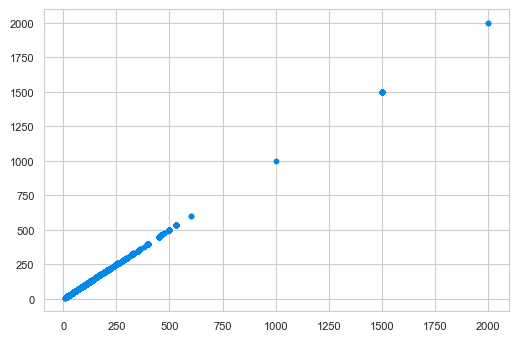

In [208]:
plt.scatter(y_test,pred_1)

In [209]:
print('Score:',model_1.score(X_test,y_test))
print('MAE:', metrics.mean_absolute_error(y_test,pred_1))
print('MSE:', metrics.mean_squared_error(y_test,pred_1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test,pred_1)))
print('R² Score:',metrics.r2_score(y_test, pred_1))
print('Adjusted R² Score:',adjusted_r2_score(y_test, pred_1, num_predictors, num_samples))

Score: 0.9999999998691782
MAE: 0.0005754574628567571
MSE: 2.229989961786725e-06
RMSE: 0.0014933150912606239
R² Score: 0.9999999998691782
Adjusted R² Score: 0.999999999868442


<AxesSubplot:xlabel='Sales', ylabel='Density'>

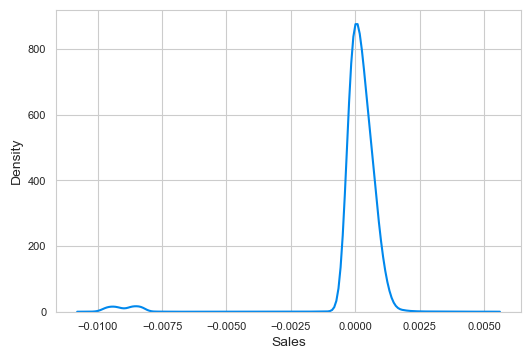

In [210]:
sns.kdeplot((y_test - pred_1))

In [211]:
coeff_dt = pd.DataFrame(model_1.coef_,X_trainValid.columns,columns=['Coefficient']).sort_values(by='Coefficient',ascending=False)
coeff_dt = coeff_dt.reset_index()
coeff_dt

,index,Coefficient
0,Order Item Discount,0.999984
1,Order Item Total,0.500000
2,Sales per customer,0.500000
3,OCountry_3,0.000084
4,Market_USCA,0.000067
...,...,...
96,MonthOrders,-0.000084
97,shipping Month,-0.000222
98,YearOrders,-0.001106
99,Order Item Discount Rate,-0.001834


## 2. Ridge Regression

In [212]:
model_2 = Ridge(alpha=1.0, random_state=101)
model_2.fit(X_trainValid, y_trainValid)

Ridge(random_state=101)

In [213]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_2, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[1. 1. 1. 1. 1.]
1.000 accuracy with a standard deviation of 0.000


In [214]:
pred_2 = model_2.predict(X_test)

### Evaluation

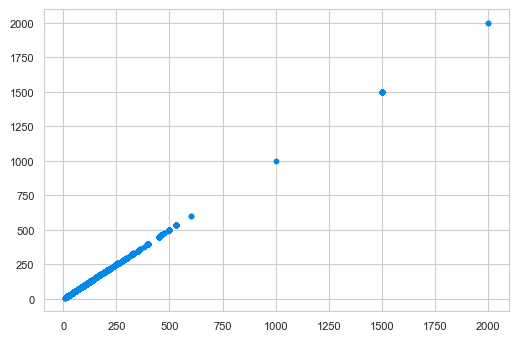

In [215]:
plt.scatter(y_test,pred_2)

In [216]:
print('Score:',model_2.score(X_test,y_test))
print('MAE:', metrics.mean_absolute_error(y_test,pred_2))
print('MSE:', metrics.mean_squared_error(y_test,pred_2))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test,pred_2)))
print('R² Score:',metrics.r2_score(y_test, pred_2))
print('Adjusted R² Score:',adjusted_r2_score(y_test, pred_2, num_predictors, num_samples))

Score: 0.9999999998691802
MAE: 0.0005752998545744577
MSE: 2.2299547909971216e-06
RMSE: 0.0014933033151363195
R² Score: 0.9999999998691802
Adjusted R² Score: 0.9999999998684441


<AxesSubplot:xlabel='Sales', ylabel='Density'>

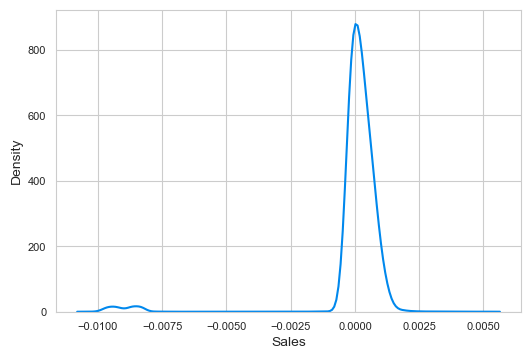

In [217]:
sns.kdeplot((y_test - pred_2))

In [218]:
coeff_dt = pd.DataFrame(model_2.coef_,X_trainValid.columns,columns=['Coefficient']).sort_values(by='Coefficient',ascending=False)
coeff_dt = coeff_dt.reset_index()
coeff_dt

,index,Coefficient
0,Order Item Discount,0.999984
1,Order Item Total,0.500001
2,Sales per customer,0.500000
3,OCountry_3,0.000082
4,Department Id,0.000067
...,...,...
96,MonthOrders,-0.000055
97,shipping Month,-0.000070
98,YearOrders,-0.000758
99,shipping Year,-0.000809


## 3. Lasso Regression

In [219]:
model_3 = linear_model.Lasso(alpha=0.1)
model_3.fit(X_trainValid, y_trainValid)

Lasso(alpha=0.1)

In [220]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_3, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.99999998 0.99999998 0.99999998 0.99999998 0.99999998]
1.000 accuracy with a standard deviation of 0.000


In [221]:
pred_3 = model_3.predict(X_test)

### Evaluation

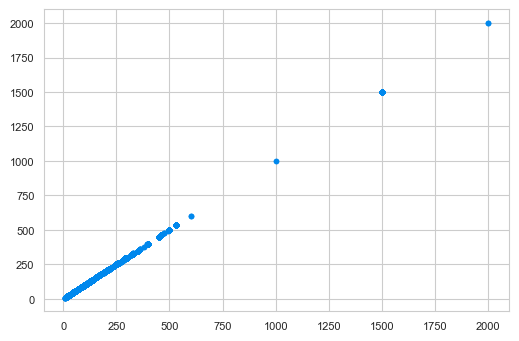

In [222]:
plt.scatter(y_test,pred_3)

In [223]:
print('Score:',model_3.score(X_test,y_test))
print('MAE:', metrics.mean_absolute_error(y_test,pred_3))
print('MSE:', metrics.mean_squared_error(y_test,pred_3))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test,pred_3)))
print('R² Score:',metrics.r2_score(y_test, pred_3))
print('Adjusted R² Score:',adjusted_r2_score(y_test, pred_3, num_predictors, num_samples))

Score: 0.9999999751601327
MAE: 0.01310781678071243
MSE: 0.00042342050433988077
RMSE: 0.020577184072167912
R² Score: 0.9999999751601327
Adjusted R² Score: 0.9999999750203574


<AxesSubplot:xlabel='Sales', ylabel='Density'>

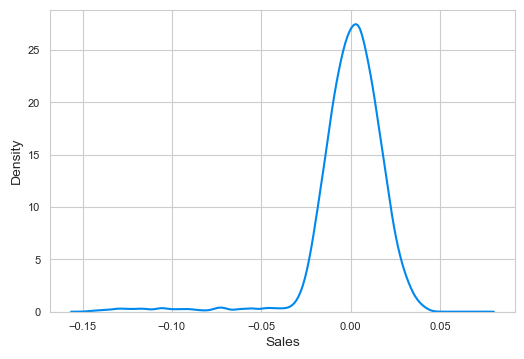

In [224]:
sns.kdeplot((y_test - pred_3))

In [225]:
coeff_dt = pd.DataFrame(model_3.coef_,X_trainValid.columns,columns=['Coefficient']).sort_values(by='Coefficient',ascending=False)
coeff_dt = coeff_dt.reset_index()
coeff_dt

,index,Coefficient
0,Sales per customer,1.049876
1,Order Item Discount,0.999710
2,Benefit per order,0.155533
3,Product Price,0.039267
4,Product Card Id,0.004327
...,...,...
96,Order Item Id,-0.000016
97,Order Item Cardprod Id,-0.004351
98,Order Item Product Price,-0.039249
99,Order Item Total,-0.049857


## 4. Decision Tree Regression

In [226]:
model_4 = DecisionTreeRegressor(random_state=101)
model_4.fit(X_trainValid, y_trainValid)

DecisionTreeRegressor(random_state=101)

In [227]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_4, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.9999193  0.99989471 0.99862903 0.99964    0.99996857]
1.000 accuracy with a standard deviation of 0.001


In [228]:
pred_4 = model_4.predict(X_test)

### Evaluation

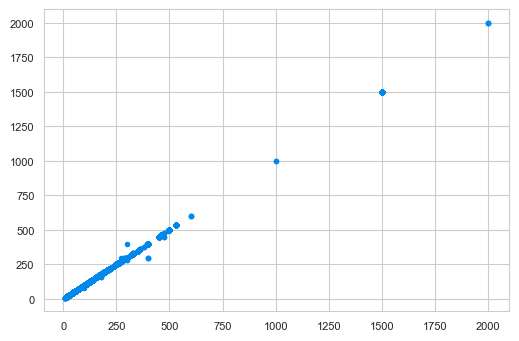

In [229]:
plt.scatter(y_test,pred_4)

In [230]:
print('Score:',model_4.score(X_test,y_test))
print('MAE:', metrics.mean_absolute_error(y_test,pred_4))
print('MSE:', metrics.mean_squared_error(y_test,pred_4))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test,pred_4)))
print('R² Score:',metrics.r2_score(y_test, pred_4))
print('Adjusted R² Score:',adjusted_r2_score(y_test, pred_4, num_predictors, num_samples))

Score: 0.9999275675150534
MAE: 0.017987206174471516
MSE: 1.234684507775159
RMSE: 1.1111635828154012
R² Score: 0.9999275675150534
Adjusted R² Score: 0.999927159933518


<AxesSubplot:xlabel='Sales', ylabel='Density'>

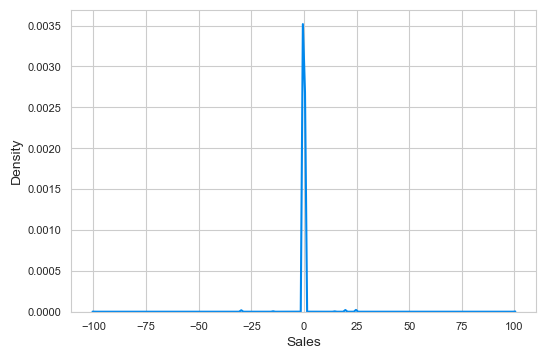

In [231]:
sns.kdeplot((y_test - pred_4))

## 5. Random Forest Regression

In [232]:
model_5 = RandomForestRegressor(max_depth=2, random_state=101)
model_5.fit(X_trainValid, y_trainValid)

RandomForestRegressor(max_depth=2, random_state=101)

In [233]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_5, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.85778861 0.85760524 0.86116281 0.85670349 0.85845031]
0.858 accuracy with a standard deviation of 0.002


In [234]:
pred_5 = model_5.predict(X_test)

### Evaluation

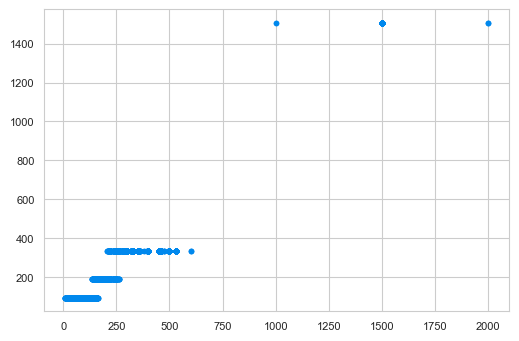

In [235]:
plt.scatter(y_test,pred_5)

In [236]:
print('Score:',model_5.score(X_test,y_test))
print('MAE:', metrics.mean_absolute_error(y_test,pred_5))
print('MSE:', metrics.mean_squared_error(y_test,pred_5))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test,pred_5)))
print('R² Score:',metrics.r2_score(y_test, pred_5))
print('Adjusted R² Score:',adjusted_r2_score(y_test, pred_5, num_predictors, num_samples))

Score: 0.8566078734371787
MAE: 38.964421014717935
MSE: 2444.2629206318556
RMSE: 49.43948746328036
R² Score: 0.8566078734371787
Adjusted R² Score: 0.8558009981358892


<AxesSubplot:xlabel='Sales', ylabel='Density'>

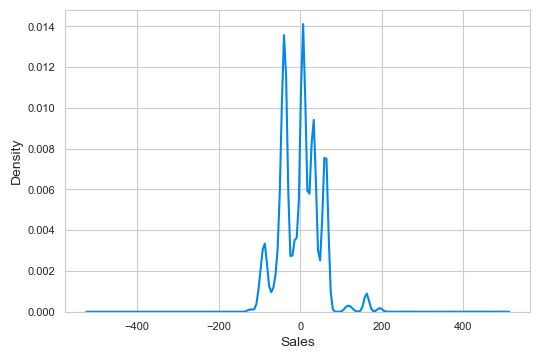

In [237]:
sns.kdeplot((y_test - pred_5))

## 6. Bayesian Regression

In [238]:
model_6 = linear_model.BayesianRidge()
model_6.fit(X_trainValid, y_trainValid)

BayesianRidge()

In [239]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_6, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[1. 1. 1. 1. 1.]
1.000 accuracy with a standard deviation of 0.000


In [240]:
pred_6 = model_6.predict(X_test)

### Evaluation

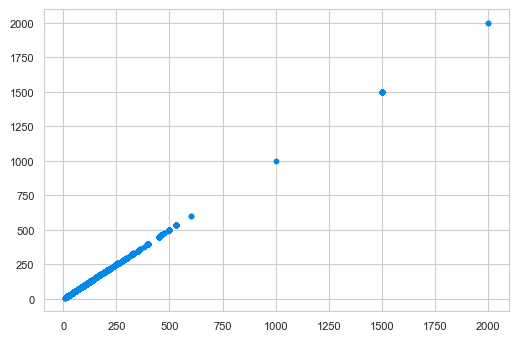

In [241]:
plt.scatter(y_test,pred_6)

In [242]:
print('Score:',model_6.score(X_test,y_test))
print('MAE:', metrics.mean_absolute_error(y_test,pred_6))
print('MSE:', metrics.mean_squared_error(y_test,pred_6))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test,pred_6)))
print('R² Score:',metrics.r2_score(y_test, pred_6))
print('Adjusted R² Score:',adjusted_r2_score(y_test, pred_6, num_predictors, num_samples))

Score: 0.9999999998691782
MAE: 0.0005754574270721686
MSE: 2.229989939164682e-06
RMSE: 0.0014933150836861865
R² Score: 0.9999999998691782
Adjusted R² Score: 0.999999999868442


<AxesSubplot:xlabel='Sales', ylabel='Density'>

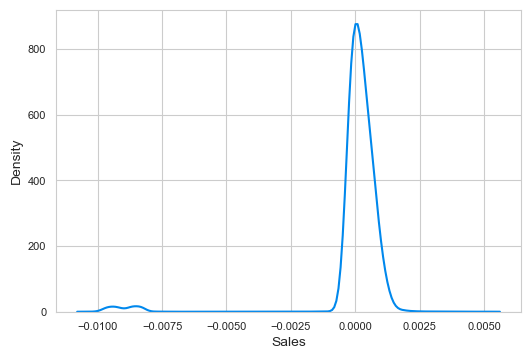

In [243]:
sns.kdeplot((y_test - pred_6))

## Comparison Of Regression Algorithms To Predict Sales Of Each Order

In [244]:
MLA = [model_1,model_2,model_3,model_4,model_5,model_6]

In [245]:
MLA_columns = []
MLA_compare = pd.DataFrame(columns = MLA_columns)

row_index = 0
for alg in MLA:  
    
    predicted = alg.fit(X_trainValid, y_trainValid).predict(X_test)
    MLA_name = alg.__class__.__name__
    MLA_compare.loc[row_index,'MLA used'] = MLA_name
    MLA_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_trainValid, y_trainValid), 4)
    MLA_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 4)
    MLA_compare.loc[row_index, 'MAE'] = metrics.mean_absolute_error(y_test,predicted)
    MLA_compare.loc[row_index, 'MSE'] = metrics.mean_squared_error(y_test,predicted)
    MLA_compare.loc[row_index, 'RMSE'] = np.sqrt(metrics.mean_squared_error(y_test,predicted))
    MLA_compare.loc[row_index, 'R² Score'] = metrics.r2_score(y_test, predicted)
    MLA_compare.loc[row_index, 'Adjusted R² Score'] = adjusted_r2_score(y_test, predicted, num_predictors, num_samples)
    
    row_index+=1
    
MLA_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)
MLA_compare

,MLA used,Train Accuracy,Test Accuracy,MAE,MSE,RMSE,R² Score,Adjusted R² Score
0,LinearRegression,1.0000,1.0000,0.000575,0.000002,0.001493,1.000000,1.000000
1,Ridge,1.0000,1.0000,0.000575,0.000002,0.001493,1.000000,1.000000
2,Lasso,1.0000,1.0000,0.013108,0.000423,0.020577,1.000000,1.000000
5,BayesianRidge,1.0000,1.0000,0.000575,0.000002,0.001493,1.000000,1.000000
3,DecisionTreeRegressor,1.0000,0.9999,0.017987,1.234685,1.111164,0.999928,0.999927
4,RandomForestRegressor,0.8602,0.8566,38.964421,2444.262921,49.439487,0.856608,0.855801


# Late Delivery Risk Prediction

In [246]:
X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(data.drop(['Delivery Status_Shipping canceled',
                                                                                      'Delivery Status_Shipping on time',
                                                                                      'Delivery Status_Late delivery',
                                                                                       'Days for shipping (real)']
                                                                                      ,axis=1), target = 'Late_delivery_risk', 
                                                                            train_size=0.7, valid_size=0.1, test_size=0.2)

print(X_train.shape), print(y_train.shape)
print(X_valid.shape), print(y_valid.shape)
print(X_test.shape), print(y_test.shape)

(126361, 97)
(126361,)
(18051, 97)
(18051,)
(36104, 97)
(36104,)


(None, None)

## Decision Trees

In [247]:
from sklearn.tree import DecisionTreeClassifier

In [248]:
dt = DecisionTreeClassifier(random_state=101)

In [249]:
dt.fit(X_train,y_train)

DecisionTreeClassifier(random_state=101)

In [250]:
pred = dt.predict(X_valid)

In [251]:
print('Score:\n',dt.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.9696969696969697 

Confusion Matrix:
 [[7795  235]
 [ 312 9709]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.97      0.97      8030
           1       0.98      0.97      0.97     10021

    accuracy                           0.97     18051
   macro avg       0.97      0.97      0.97     18051
weighted avg       0.97      0.97      0.97     18051



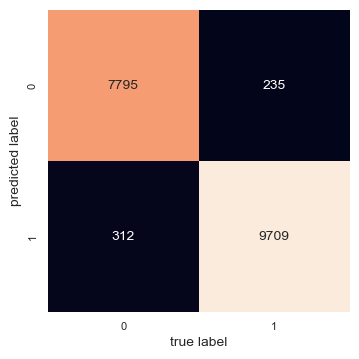

In [252]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [253]:
df_eval = pd.DataFrame({'Label':y_valid,
                        'Prediction': pred})
df_eval

,Label,Prediction
96591,1,1
47035,0,0
56372,0,0
51696,0,1
126717,0,0
...,...,...
94866,0,0
47232,1,1
19757,1,1
168841,1,1


In [254]:
pd.DataFrame(data=dt.feature_importances_,index=X_train.columns,columns=['Value']).sort_values(by='Value',ascending=False)

,Value
shipping Day,0.251333
DayOrders,0.219573
Days for shipment (scheduled),0.168283
HourOrders,0.055392
OStatus_2,0.034928
...,...
Customer Country_USA,0.000043
Shipping Mode_Standard Class,0.000000
ORegion_1,0.000000
ORegion_2,0.000000


## Random Forest

In [255]:
from sklearn.ensemble import RandomForestClassifier

In [256]:
rf = RandomForestClassifier(n_estimators=100,random_state=101)

In [257]:
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=101)

In [258]:
pred_rf = rf.predict(X_valid)

In [259]:
df_eval = pd.DataFrame({'Label':y_valid,
                        'Prediction': pred_rf
                        })
df_eval

,Label,Prediction
96591,1,1
47035,0,0
56372,0,0
51696,0,0
126717,0,0
...,...,...
94866,0,0
47232,1,1
19757,1,1
168841,1,1


In [260]:
print('Score:\n',rf.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred_rf),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred_rf))

Score:
 0.8997839454877846 

Confusion Matrix:
 [[7590  440]
 [1369 8652]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.95      0.89      8030
           1       0.95      0.86      0.91     10021

    accuracy                           0.90     18051
   macro avg       0.90      0.90      0.90     18051
weighted avg       0.91      0.90      0.90     18051



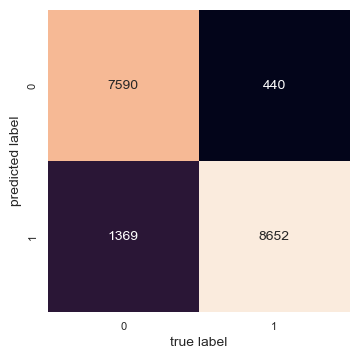

In [261]:
mat_T = confusion_matrix(y_valid,pred_rf)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [262]:
pd.DataFrame(data=rf.feature_importances_,index=X_train.columns,columns=['Value']).sort_values(by='Value',ascending=False)

,Value
Days for shipment (scheduled),0.096198
Shipping Mode_Standard Class,0.083443
shipping Day,0.037013
DayOrders,0.035065
shipping Hour,0.034681
...,...
CState_6,0.000582
CState_3,0.000576
ORegion_1,0.000000
ORegion_2,0.000000


## Bagging Classifier Algorithm

In [263]:
from sklearn.ensemble import BaggingClassifier

In [264]:
bca = BaggingClassifier(random_state=101)

In [265]:
bca.fit(X_train, y_train)

BaggingClassifier(random_state=101)

In [266]:
pred = bca.predict(X_valid)

In [267]:
print('Score:\n',bca.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.9870921278599524 

Confusion Matrix:
 [[7962   68]
 [ 165 9856]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      8030
           1       0.99      0.98      0.99     10021

    accuracy                           0.99     18051
   macro avg       0.99      0.99      0.99     18051
weighted avg       0.99      0.99      0.99     18051



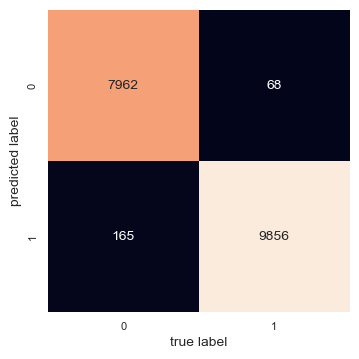

In [268]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Gradient Boosting Classifier

In [269]:
from sklearn.ensemble import GradientBoostingClassifier

In [270]:
gbc = GradientBoostingClassifier(random_state=101)

In [271]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier(random_state=101)

In [272]:
pred = gbc.predict(X_valid)

In [273]:
print('Score:\n',gbc.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.9284804165974184 

Confusion Matrix:
 [[7307  723]
 [ 568 9453]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      8030
           1       0.93      0.94      0.94     10021

    accuracy                           0.93     18051
   macro avg       0.93      0.93      0.93     18051
weighted avg       0.93      0.93      0.93     18051



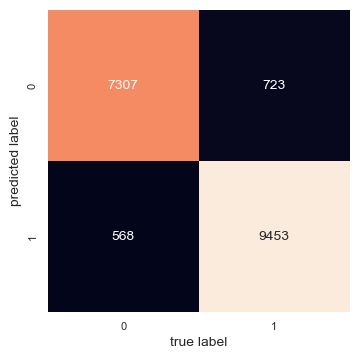

In [274]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## XGboost Classifier

In [275]:
from xgboost import XGBClassifier

In [276]:
from sklearn.metrics import accuracy_score

In [277]:
xgb = XGBClassifier()

In [278]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [279]:
pred = xgb.predict(X_valid)

In [280]:
predictions = [round(value) for value in pred]

In [281]:
accuracy = accuracy_score(y_valid, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 99.99%


In [282]:
print('Score:\n',xgb.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.9999446014071243 

Confusion Matrix:
 [[ 8029     1]
 [    0 10021]] 

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      8030
           1       1.00      1.00      1.00     10021

    accuracy                           1.00     18051
   macro avg       1.00      1.00      1.00     18051
weighted avg       1.00      1.00      1.00     18051



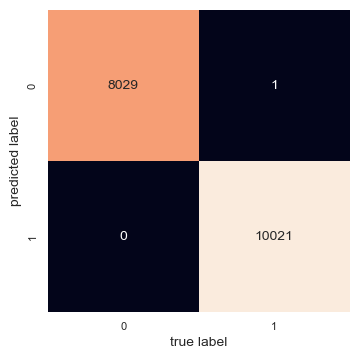

In [283]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

# Test Models

In [284]:
X_trainValid = pd.concat([X_train,X_valid],axis=0)

In [285]:
y_trainValid = pd.concat([y_train,y_valid],axis=0)

## 1. Decision Trees

In [286]:
model_1 = DecisionTreeClassifier(random_state=101)
model_1.fit(X_trainValid, y_trainValid)

DecisionTreeClassifier(random_state=101)

In [287]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_1, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.95951436 0.94395716 0.95824485 0.95623673 0.96756994]
0.957 accuracy with a standard deviation of 0.008


In [288]:
pred_1 = model_1.predict(X_test)

In [289]:
print('Score:\n',model_1.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_1),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_1))

Score:
 0.9630511854642145 

Confusion Matrix:
 [[15642   677]
 [  657 19128]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96     16319
           1       0.97      0.97      0.97     19785

    accuracy                           0.96     36104
   macro avg       0.96      0.96      0.96     36104
weighted avg       0.96      0.96      0.96     36104



## 2. Random Forest

In [290]:
model_2 = RandomForestClassifier(n_estimators=100,random_state=101)
model_2.fit(X_trainValid, y_trainValid)

RandomForestClassifier(random_state=101)

In [291]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_2, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.86737143 0.87727357 0.87055674 0.87298033 0.87388053]
0.872 accuracy with a standard deviation of 0.003


In [292]:
pred_2 = model_2.predict(X_test)

In [293]:
print('Score:\n',model_2.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_2),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_2))

Score:
 0.9199811655218258 

Confusion Matrix:
 [[15519   800]
 [ 2089 17696]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.95      0.91     16319
           1       0.96      0.89      0.92     19785

    accuracy                           0.92     36104
   macro avg       0.92      0.92      0.92     36104
weighted avg       0.92      0.92      0.92     36104



## 3. Bagging Classifier

In [294]:
model_3 = BaggingClassifier()
model_3.fit(X_trainValid, y_trainValid)

BaggingClassifier()

In [295]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_3, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.97592558 0.98008032 0.97627181 0.96752377 0.98813591]
0.978 accuracy with a standard deviation of 0.007


In [296]:
pred_3 = model_3.predict(X_test)

In [297]:
print('Score:\n',model_3.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_3),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_3))

Score:
 0.9904165743407932 

Confusion Matrix:
 [[16216   103]
 [  243 19542]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     16319
           1       0.99      0.99      0.99     19785

    accuracy                           0.99     36104
   macro avg       0.99      0.99      0.99     36104
weighted avg       0.99      0.99      0.99     36104



## 4. Gradient Boosting Classifier

In [298]:
model_4 = GradientBoostingClassifier(random_state=101)
model_4.fit(X_trainValid, y_trainValid)

GradientBoostingClassifier(random_state=101)

In [299]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_4, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.92463761 0.91969809 0.92496076 0.90820331 0.92410673]
0.920 accuracy with a standard deviation of 0.006


In [300]:
pred_4 = model_4.predict(X_test)

In [301]:
print('Score:\n',model_4.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_4),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_4))

Score:
 0.9181254154664303 

Confusion Matrix:
 [[14803  1516]
 [ 1440 18345]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.91      0.91     16319
           1       0.92      0.93      0.93     19785

    accuracy                           0.92     36104
   macro avg       0.92      0.92      0.92     36104
weighted avg       0.92      0.92      0.92     36104



## 5. XGboost Classifier

In [302]:
model_5 = XGBClassifier()
model_5.fit(X_trainValid, y_trainValid)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [303]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_5, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[1.         0.99983843 0.99993075 0.99993075 0.99993075]
1.000 accuracy with a standard deviation of 0.000


In [304]:
pred_5 = model_5.predict(X_test)

In [305]:
print('Score:\n',model_5.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_5),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_5))

Score:
 0.9999446044759583 

Confusion Matrix:
 [[16317     2]
 [    0 19785]] 

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     16319
           1       1.00      1.00      1.00     19785

    accuracy                           1.00     36104
   macro avg       1.00      1.00      1.00     36104
weighted avg       1.00      1.00      1.00     36104



## Comparison Of Classification Algorithms To Predict The Risk Of On-Time Delivery Of Each Order

In [306]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [307]:
MLA = [model_1,model_2,model_3,model_4,model_5]

In [308]:
MLA_columns = []
MLA_compare = pd.DataFrame(columns = MLA_columns)

row_index = 0
for alg in MLA:  
    
    predicted = alg.fit(X_trainValid, y_trainValid).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    MLA_name = alg.__class__.__name__
    MLA_compare.loc[row_index,'MLA used'] = MLA_name
    MLA_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_trainValid, y_trainValid), 4)
    MLA_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 4)
    MLA_compare.loc[row_index, 'Precission'] = precision_score(y_test, predicted)
    MLA_compare.loc[row_index, 'Recall'] = recall_score(y_test, predicted)
    MLA_compare.loc[row_index, 'AUC'] = auc(fp, tp)
    MLA_compare.loc[row_index, 'F1-Score'] = f1_score(y_test, predicted)
    
    row_index+=1
    
MLA_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)
MLA_compare

,MLA used,Train Accuracy,Test Accuracy,Precission,Recall,AUC,F1-Score
4,XGBClassifier,1.0000,0.9999,0.999899,1.000000,0.999939,0.999949
2,BaggingClassifier,0.9999,0.9920,0.996486,0.988880,0.992326,0.992669
0,DecisionTreeClassifier,1.0000,0.9631,0.965817,0.966793,0.962654,0.966305
1,RandomForestClassifier,1.0000,0.9200,0.956747,0.894415,0.922696,0.924532
3,GradientBoostingClassifier,0.9199,0.9181,0.923670,0.927218,0.917160,0.925440


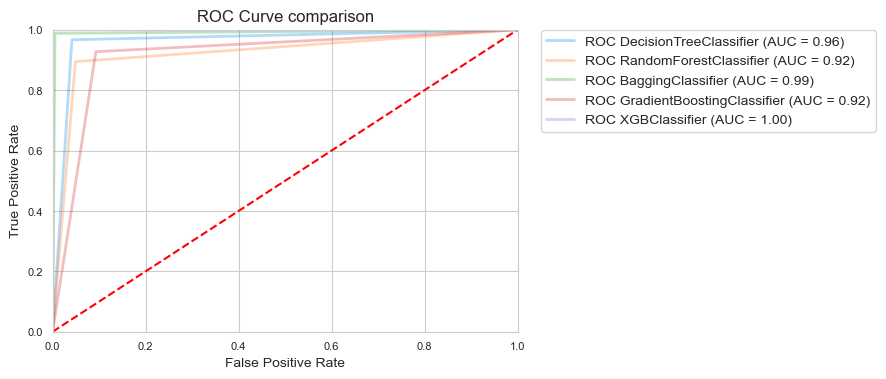

In [309]:
# Creating plot to show the ROC for all MLA
index = 1
for alg in MLA:
    
    
    predicted = alg.fit(X_trainValid, y_trainValid).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    roc_auc_mla = auc(fp, tp)
    MLA_name = alg.__class__.__name__
    plt.plot(fp, tp, lw=2, alpha=0.3, label='ROC %s (AUC = %0.2f)'  % (MLA_name, roc_auc_mla))
   
    index+=1

plt.title('ROC Curve comparison')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.plot([0,1],[0,1],'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')    
plt.show()

# END =)